In [12]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import xarray
import numpy as np
import logging
import cmocean
import copy
from netCDF4 import Dataset

cmocean.cm.balance
cmap = copy.copy(cmocean.cm.balance)
cmap.set_bad('gray')
    # Ideally would use SSH, but some diag_tables only saved zos----for coupled waves
pp_root_12="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling/examples/NWA12.COBALT_all_wave1_12/"
pp_root_6="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling/examples/NWA12.COBALT_all_wave1_6/"
pp_root_3="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling/examples/NWA12.COBALT_all_wave1_3/"
pp_root_5="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling/examples/NWA12.COBALT_all_wave5_12/"


ocean_daily_12= xarray.open_dataset(pp_root_12+"19930101.ocean_daily.nc")
ocean_daily_6= xarray.open_dataset(pp_root_6+"19930101.ocean_daily.nc")
ocean_daily_3= xarray.open_dataset(pp_root_3+"19930101.ocean_daily.nc")
ocean_daily_5= xarray.open_dataset(pp_root_5+"19930101.ocean_daily.nc")

model_grid_x = ocean_daily_12.variables['xh']
model_grid_y = ocean_daily_12.variables['yh']

#------------------------------------------ssh comparison between different momentum equations
ssh_12=ocean_daily_12.variables['ssh']
# ssh_12_12 = xarray.DataArray(ssh_12[:30,:,:], dims=["time","yh", "xh"])
# ssh_12_34 = xarray.DataArray(ssh_12[30:59,:,:], dims=["time","yh", "xh"])
# ssh_12_12_ave = ssh_12_12.mean('time')
# ssh_12_34_ave = ssh_12_34.mean('time')
t_12=ocean_daily_12.variables['time']
ssh_12_ave = ssh_12.mean('time')

SST_12=ocean_daily_12.variables['SST']
SST_12_ave = SST_12.mean('time')
# SST_12_12 = xarray.DataArray(SST_12[:30,:,:], dims=["time","yh", "xh"])
# SST_12_34 = xarray.DataArray(SST_12[30:59,:,:], dims=["time","yh", "xh"])
# SST_12_12_ave = SST_12_12.mean('time')
# SST_12_34_ave = SST_12_34.mean('time')

MLD_EN1_12=ocean_daily_12.variables['MLD_EN1']
MLD_EN1_12_ave = MLD_EN1_12.mean('time')
# MLD_EN1_12_12 = xarray.DataArray(MLD_EN1_12[:30,:,:], dims=["time","yh", "xh"])
# MLD_EN1_12_34 = xarray.DataArray(MLD_EN1_12[30:59,:,:], dims=["time","yh", "xh"])
# MLD_EN1_12_12_ave = MLD_EN1_12_12.mean('time')
# MLD_EN1_12_34_ave = MLD_EN1_12_34.mean('time')

ssx_12=ocean_daily_12.variables['surface_stokes_x']
ssy_12=ocean_daily_12.variables['surface_stokes_y']
ssx_12_ave = ssx_12.mean('time')[:,1:]
ssx_12_ave = xarray.DataArray(ssx_12_ave, dims=["yh", "xh"])
ssy_12_ave = ssy_12.mean('time')[1:,:]
ssy_12_ave = xarray.DataArray(ssy_12_ave, dims=["yh", "xh"])

ssu_12_o=ocean_daily_12.variables['ssu']
ssv_12_o=ocean_daily_12.variables['ssv']
ssu_12 = xarray.DataArray(ssu_12_o, dims=["time","yh", "xh"])
ssv_12 = xarray.DataArray(ssv_12_o, dims=["time","yh", "xh"])
ssu_12=ssu_12[:,:,1:]
ssv_12=ssv_12[:,1:,:]
# ssu_12_ave = ssu_12.mean('time')[:,1:]
# ssv_12_ave = ssv_12.mean('time')[1:,:]
SS_mag_12=np.sqrt(ssu_12**2 + ssv_12**2)
SS_mag_12_ave = SS_mag_12.mean('time')


ssh_6_o=ocean_daily_6.variables['ssh']
ssh_6 = xarray.DataArray(ssh_6_o, dims=["time","yh", "xh"])
# ssh_6_12 = xarray.DataArray(ssh_6[:30,:,:], dims=["time","yh", "xh"])
# ssh_6_34 = xarray.DataArray(ssh_6[30:59,:,:], dims=["time","yh", "xh"])
ssh_6_ave = ssh_6.mean('time')
# ssh_6_12_ave = ssh_6_12.mean('time')
# ssh_6_34_ave = ssh_6_34.mean('time')

ssu_6_o=ocean_daily_6.variables['ssu']
ssv_6_o=ocean_daily_6.variables['ssv']
ssu_6 = xarray.DataArray(ssu_6_o, dims=["time","yh", "xh"])
ssv_6 = xarray.DataArray(ssv_6_o, dims=["time","yh", "xh"])
ssu_6=ssu_6[:,:,1:]
ssv_6=ssv_6[:,1:,:]
SS_mag_6=np.sqrt(ssu_6**2 + ssv_6**2)
SS_mag_6_ave = SS_mag_6.mean('time')

SST_6_o=ocean_daily_6.variables['SST']
SST_6 = xarray.DataArray(SST_6_o, dims=["time","yh", "xh"])
SST_6_ave = SST_6.mean('time')


MLD_EN1_6_o=ocean_daily_6.variables['MLD_EN1']
MLD_EN1_6 = xarray.DataArray(MLD_EN1_6_o, dims=["time","yh", "xh"])
MLD_EN1_6_ave = MLD_EN1_6.mean('time')


ssx_6_o=ocean_daily_6.variables['surface_stokes_x']
ssy_6_o=ocean_daily_6.variables['surface_stokes_y']
ssx_6 = xarray.DataArray(ssx_6_o, dims=["time","yh", "xh"])
ssy_6 = xarray.DataArray(ssy_6_o, dims=["time","yh", "xh"])
ssx_6_ave = ssx_6.mean('time')[:,1:]
ssy_6_ave = ssy_6.mean('time')[1:,:]

ssu_3_o=ocean_daily_3.variables['ssu']
ssv_3_o=ocean_daily_3.variables['ssv']
ssu_3 = xarray.DataArray(ssu_3_o, dims=["time","yh", "xh"])
ssv_3 = xarray.DataArray(ssv_3_o, dims=["time","yh", "xh"])
ssu_3=ssu_3[:,:,1:]
ssv_3=ssv_3[:,1:,:]
SS_mag_3=np.sqrt(ssu_3**2 + ssv_3**2)
SS_mag_3_ave = SS_mag_3.mean('time')


ssh_3_o=ocean_daily_3.variables['ssh']
ssh_3 = xarray.DataArray(ssh_3_o, dims=["time","yh", "xh"])
ssh_3_ave = ssh_3.mean('time')



SST_3_o=ocean_daily_3.variables['SST']
SST_3 = xarray.DataArray(SST_3_o, dims=["time","yh", "xh"])
SST_3_ave = SST_3.mean('time')


MLD_EN1_3_o=ocean_daily_3.variables['MLD_EN1']
MLD_EN1_3 = xarray.DataArray(MLD_EN1_3_o, dims=["time","yh", "xh"])
MLD_EN1_3_ave = MLD_EN1_3.mean('time')


ssx_3_o=ocean_daily_3.variables['surface_stokes_x']
ssy_3_o=ocean_daily_3.variables['surface_stokes_y']
ssx_3 = xarray.DataArray(ssx_3_o, dims=["time","yh", "xh"])
ssy_3 = xarray.DataArray(ssy_3_o, dims=["time","yh", "xh"])
ssx_3_ave = ssx_3.mean('time')[:,1:]
ssy_3_ave = ssy_3.mean('time')[1:,:]

ssu_5_o=ocean_daily_5.variables['ssu']
ssv_5_o=ocean_daily_5.variables['ssv']
ssu_5 = xarray.DataArray(ssu_5_o, dims=["time","yh", "xh"])
ssv_5 = xarray.DataArray(ssv_5_o, dims=["time","yh", "xh"])
ssu_5=ssu_5[:,:,1:]
ssv_5=ssv_5[:,1:,:]
SS_mag_5=np.sqrt(ssu_5**2 + ssv_5**2)
SS_mag_5_ave = SS_mag_5.mean('time')


ssh_5_o=ocean_daily_5.variables['ssh']
ssh_5 = xarray.DataArray(ssh_5_o, dims=["time","yh", "xh"])
ssh_5_ave = ssh_5.mean('time')



SST_5_o=ocean_daily_5.variables['SST']
SST_5 = xarray.DataArray(SST_5_o, dims=["time","yh", "xh"])
SST_5_ave = SST_5.mean('time')


MLD_EN1_5_o=ocean_daily_5.variables['MLD_EN1']
MLD_EN1_5 = xarray.DataArray(MLD_EN1_5_o, dims=["time","yh", "xh"])
MLD_EN1_5_ave = MLD_EN1_5.mean('time')


ssx_5_o=ocean_daily_5.variables['surface_stokes_x']
ssy_5_o=ocean_daily_5.variables['surface_stokes_y']
ssx_5 = xarray.DataArray(ssx_5_o, dims=["time","yh", "xh"])
ssy_5 = xarray.DataArray(ssy_5_o, dims=["time","yh", "xh"])
ssx_5_ave = ssx_5.mean('time')[:,1:]
ssy_5_ave = ssy_5.mean('time')[1:,:]

#nx_wave=ocean_daily_wave.variables['x']
dassh_12_ave=xarray.DataArray(ssh_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassh_6_ave=xarray.DataArray(ssh_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassh_5_ave=xarray.DataArray(ssh_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassh_3_ave=xarray.DataArray(ssh_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_ssh_6_ave=ssh_6_ave - ssh_12_ave
da_diff_ssh_6=xarray.DataArray(diff_ssh_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})

diff_ssh_3_ave=ssh_3_ave - ssh_12_ave
da_diff_ssh_3=xarray.DataArray(diff_ssh_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})

diff_ssh_5_ave=ssh_5_ave - ssh_12_ave
da_diff_ssh_5=xarray.DataArray(diff_ssh_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


# ###show the difference
# diff_ssh_6_12_ave=ssh_6_12_ave - ssh_12_12_ave
# da_diff_ssh_6_12=xarray.DataArray(diff_ssh_6_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_6_12.plot()
# plt.title('Wave 1/6 - Wave 1/12 ssh Jan mean')
# plt.show()


# diff_ssh_3_12_ave=ssh_3_12_ave - ssh_12_12_ave
# da_diff_ssh_3_12=xarray.DataArray(diff_ssh_3_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_3_12.plot()
# plt.title('Wave 1/3 - Wave 1/12 ssh Jan mean')
# plt.show()

# diff_ssh_36_12_ave=ssh_3_12_ave - ssh_6_12_ave
# da_diff_ssh_36_12=xarray.DataArray(diff_ssh_36_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_36_12.plot()
# plt.title('Wave 1/3 - Wave 1/6 ssh Jan mean')
# plt.show()

# ###show the difference
# diff_ssh_6_34_ave=ssh_6_34_ave - ssh_12_34_ave
# da_diff_ssh_6_34=xarray.DataArray(diff_ssh_6_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_6_34.plot()
# plt.title('Wave 1/6 - Wave 1/12 ssh Feb mean')
# plt.show()


# diff_ssh_3_34_ave=ssh_3_34_ave - ssh_12_34_ave
# da_diff_ssh_3_34=xarray.DataArray(diff_ssh_3_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_3_34.plot()
# plt.title('Wave 1/3 - Wave 1/12 ssh Feb mean')
# plt.show()

# diff_ssh_36_34_ave=ssh_3_34_ave - ssh_6_34_ave
# da_diff_ssh_36_34=xarray.DataArray(diff_ssh_36_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssh_36_34.plot()
# plt.title('Wave 1/3 - Wave 1/6 ssh Feb mean')
# plt.show()

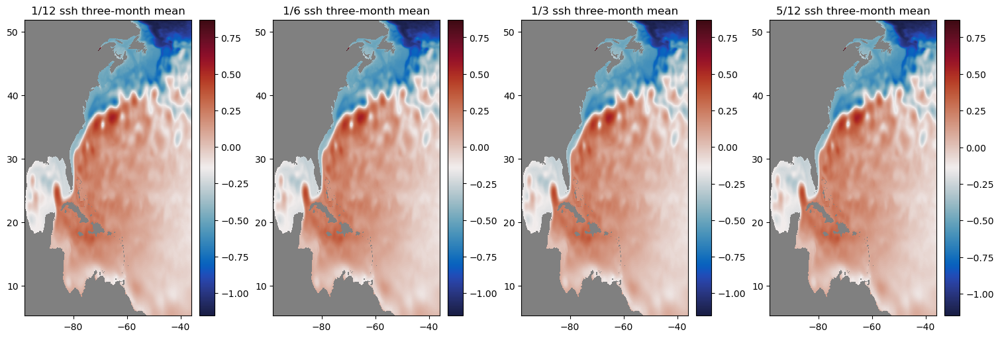

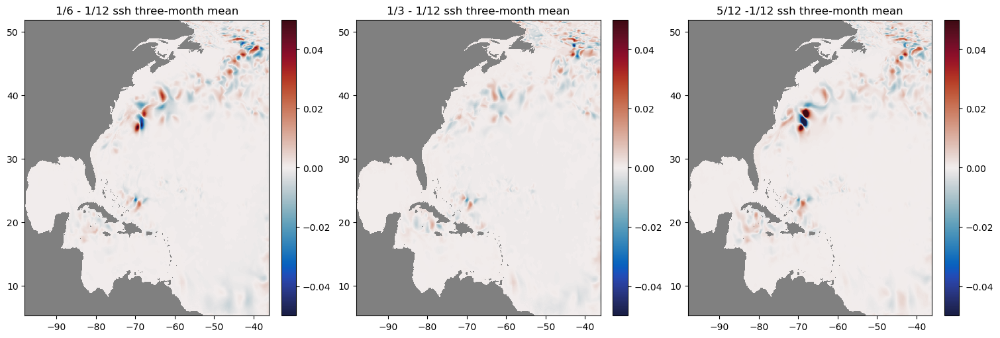

In [13]:

fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, dassh_12_ave, cmap=cmap, shading='auto')
axes[0].set_title('1/12 ssh three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, dassh_6_ave, cmap=cmap, shading='auto')
axes[1].set_title('1/6 ssh three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, dassh_3_ave, cmap=cmap, shading='auto')
axes[2].set_title('1/3 ssh three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, dassh_5_ave, cmap=cmap, shading='auto')
axes[3].set_title('5/12 ssh three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_ssh_6_ave, cmap=cmap, shading='auto', vmin=-0.05,vmax=0.05)
axes[0].set_title('1/6 - 1/12 ssh three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_ssh_3_ave, cmap=cmap, shading='auto', vmin=-0.05,vmax=0.05)
axes[1].set_title('1/3 - 1/12 ssh three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_ssh_5_ave, cmap=cmap, shading='auto', vmin=-0.05,vmax=0.05)
axes[2].set_title('5/12 -1/12 ssh three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

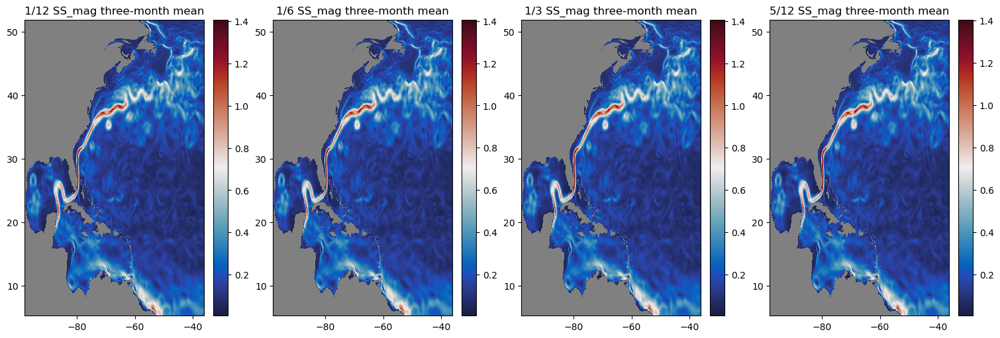

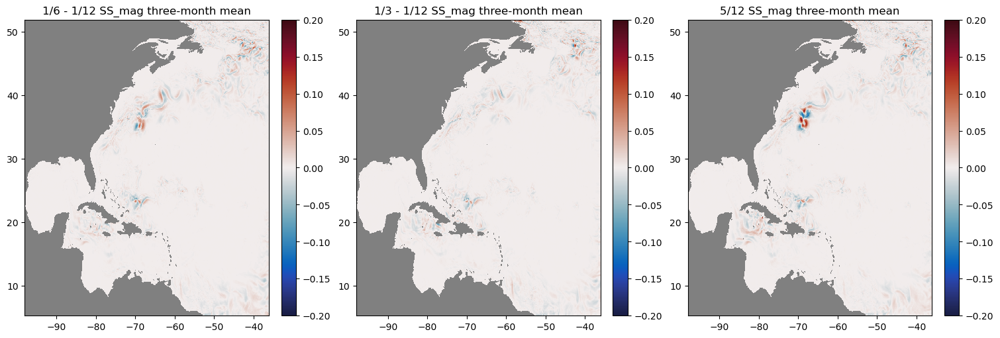

In [14]:
# daSS_mag_12_ave=xarray.DataArray(SS_mag_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# daSS_mag_12_ave.plot()
# plt.title('Ocean 1/12 with Wave 1/12 SS_mag three-month mean')


# daSS_mag_6_ave=xarray.DataArray(SS_mag_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# daSS_mag_6_ave.plot()
# plt.title('Ocean 1/12 with Wave 1/6 SS_mag three-month mean')

# daSS_mag_3_ave=xarray.DataArray(SS_mag_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# daSS_mag_3_ave.plot()
# plt.title('Ocean 1/12 with Wave 1/3 SS_mag three-month mean')


# diff_SS_mag_6_ave=SS_mag_6_ave - SS_mag_12_ave
# da_diff_SS_mag_6_ave=xarray.DataArray(diff_SS_mag_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SS_mag_6_ave.plot()
# plt.title('Wave 1/6 - Wave 1/12 SS_mag three month mean')
# plt.show()

# diff_SS_mag_3_ave=SS_mag_3_ave - SS_mag_12_ave
# da_diff_SS_mag_3_ave=xarray.DataArray(diff_SS_mag_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SS_mag_3_ave.plot()
# plt.title('Wave 1/3 - Wave 1/12 SS_mag three month mean')
# plt.show()

# diff_SS_mag_5_ave=SS_mag_5_ave - SS_mag_12_ave
# da_diff_SS_mag_5_ave=xarray.DataArray(diff_SS_mag_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SS_mag_5_ave.plot()
# plt.title('Wave 5/12 - Wave 1/12 SS_mag three month mean')
# plt.show()

# diff_SS_mag_36_ave=SS_mag_3_ave - SS_mag_6_ave
# da_diff_SS_mag_36_ave=xarray.DataArray(diff_SS_mag_36_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SS_mag_36_ave.plot()
# plt.title('Wave 1/3 - Wave 1/6 SS_mag three month mean')
# plt.show()
daSS_mag_12_ave=xarray.DataArray(SS_mag_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSS_mag_6_ave=xarray.DataArray(SS_mag_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSS_mag_5_ave=xarray.DataArray(SS_mag_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSS_mag_3_ave=xarray.DataArray(SS_mag_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_SS_mag_6_ave=SS_mag_6_ave - SS_mag_12_ave
da_diff_SS_mag_6=xarray.DataArray(diff_SS_mag_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_SS_mag_3_ave=SS_mag_3_ave - SS_mag_12_ave
da_diff_SS_mag_3=xarray.DataArray(diff_SS_mag_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_SS_mag_5_ave=SS_mag_5_ave - SS_mag_12_ave
da_diff_SS_mag_5=xarray.DataArray(diff_SS_mag_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})



fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, daSS_mag_12_ave, cmap=cmap, shading='auto')
axes[0].set_title('1/12 SS_mag three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, daSS_mag_6_ave, cmap=cmap, shading='auto')
axes[1].set_title('1/6 SS_mag three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, daSS_mag_3_ave, cmap=cmap, shading='auto')
axes[2].set_title('1/3 SS_mag three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, daSS_mag_5_ave, cmap=cmap, shading='auto')
axes[3].set_title('5/12 SS_mag three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_SS_mag_6_ave, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[0].set_title('1/6 - 1/12 SS_mag three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_SS_mag_3_ave, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[1].set_title('1/3 - 1/12 SS_mag three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_SS_mag_5_ave, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[2].set_title('5/12 SS_mag three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

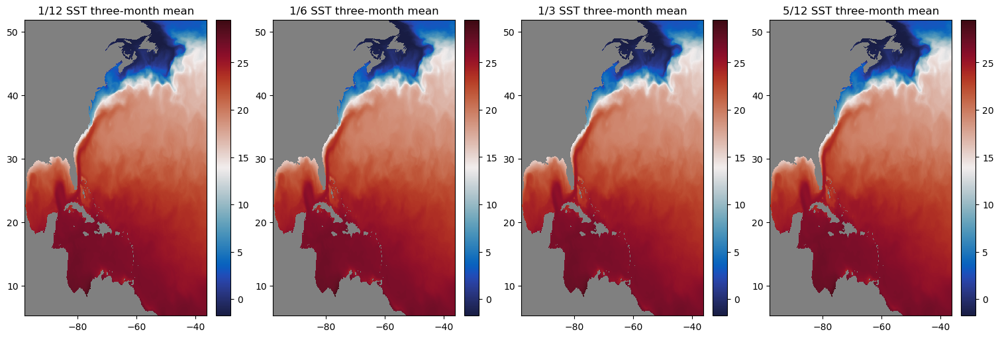

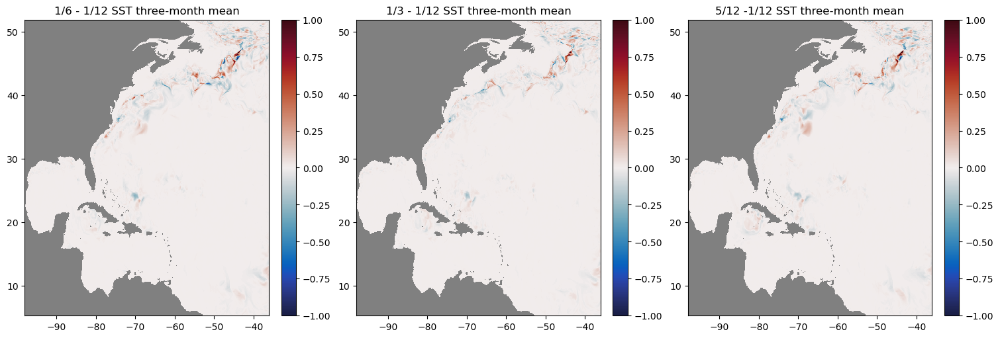

In [15]:
daSST_12_ave=xarray.DataArray(SST_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSST_6_ave=xarray.DataArray(SST_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSST_5_ave=xarray.DataArray(SST_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daSST_3_ave=xarray.DataArray(SST_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_SST_6_ave=SST_6_ave - SST_12_ave
da_diff_SST_6=xarray.DataArray(diff_SST_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_SST_3_ave=SST_3_ave - SST_12_ave
da_diff_SST_3=xarray.DataArray(diff_SST_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_SST_5_ave=SST_5_ave - SST_12_ave
da_diff_SST_5=xarray.DataArray(diff_SST_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})



fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, daSST_12_ave, cmap=cmap, shading='auto')
axes[0].set_title('1/12 SST three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, daSST_6_ave, cmap=cmap, shading='auto')
axes[1].set_title('1/6 SST three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, daSST_3_ave, cmap=cmap, shading='auto')
axes[2].set_title('1/3 SST three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, daSST_5_ave, cmap=cmap, shading='auto')
axes[3].set_title('5/12 SST three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_SST_6_ave, cmap=cmap, shading='auto',vmin=-1,vmax=1)
axes[0].set_title('1/6 - 1/12 SST three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_SST_3_ave, cmap=cmap, shading='auto',vmin=-1,vmax=1)
axes[1].set_title('1/3 - 1/12 SST three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_SST_5_ave, cmap=cmap, shading='auto',vmin=-1,vmax=1)
axes[2].set_title('5/12 -1/12 SST three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()
# #nx_wave=ocean_daily_wave.variables['x']
# daSST_12_ave=xarray.DataArray(SST_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# daSST_12_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/12 SST three-month mean')

# ###show the difference
# diff_SST_6_ave=SST_6_ave - SST_12_ave
# da_diff_SST_6=xarray.DataArray(diff_SST_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_6.plot()
# plt.title('Wave 1/6 - Wave 1/12 SST three-month mean')
# plt.show()


# diff_SST_3_ave=SST_3_ave - SST_12_ave
# da_diff_SST_3=xarray.DataArray(diff_SST_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_3.plot()
# plt.title('Wave 1/3 - Wave 1/12 SST three-month mean')
# plt.show()

# diff_SST_5_ave=SST_5_ave - SST_12_ave
# da_diff_SST_5=xarray.DataArray(diff_SST_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_5.plot()
# plt.title('Wave 5/12 - Wave 1/12 SST three-month mean')
# plt.show()

# diff_SST_36_ave=SST_3_ave - SST_6_ave
# da_diff_SST_36=xarray.DataArray(diff_SST_36_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_36.plot()
# plt.title('Wave 1/3 - Wave 1/6 SST three-month mean')
# plt.show()

###show the difference
# diff_SST_6_12_ave=SST_6_12_ave - SST_12_12_ave
# da_diff_SST_6_12=xarray.DataArray(diff_SST_6_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_6_12.plot()
# plt.title('Wave 1/6 - Wave 1/12 SST Jan mean')
# plt.show()


# diff_SST_3_12_ave=SST_3_12_ave - SST_12_12_ave
# da_diff_SST_3_12=xarray.DataArray(diff_SST_3_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_3_12.plot()
# plt.title('Wave 1/3 - Wave 1/12 SST Jan mean')
# plt.show()


# diff_SST_36_12_ave=SST_3_12_ave - SST_6_12_ave
# da_diff_SST_36_12=xarray.DataArray(diff_SST_36_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_36_12.plot()
# plt.title('Wave 1/3 - Wave 1/6 SST Jan mean')
# plt.show()
###show the difference
# diff_SST_6_34_ave=SST_6_34_ave - SST_12_34_ave
# da_diff_SST_6_34=xarray.DataArray(diff_SST_6_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_6_34.plot()
# plt.title('Wave 1/6 - Wave 1/12 SST Feb mean')
# plt.show()


# diff_SST_3_34_ave=SST_3_34_ave - SST_12_34_ave
# da_diff_SST_3_34=xarray.DataArray(diff_SST_3_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_3_34.plot()
# plt.title('Wave 1/3 - Wave 1/12 SST Feb mean')
# plt.show()


# diff_SST_36_34_ave=SST_3_34_ave - SST_6_34_ave
# da_diff_SST_36_34=xarray.DataArray(diff_SST_36_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_SST_3_34.plot()
# plt.title('Wave 1/3 - Wave 1/6 SST Feb mean')
# plt.show()

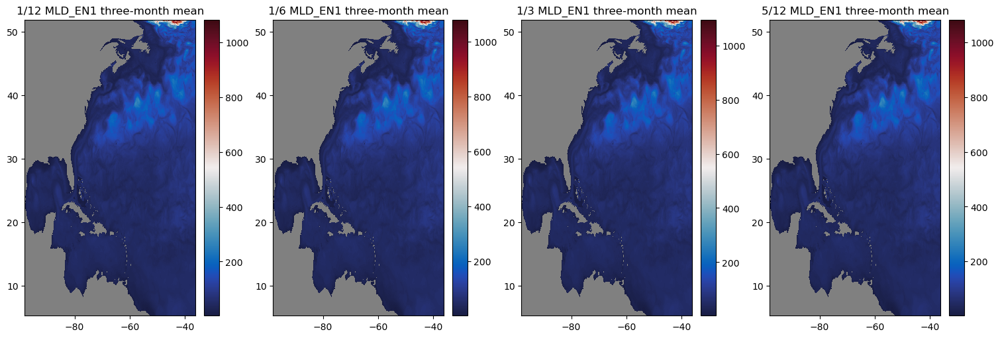

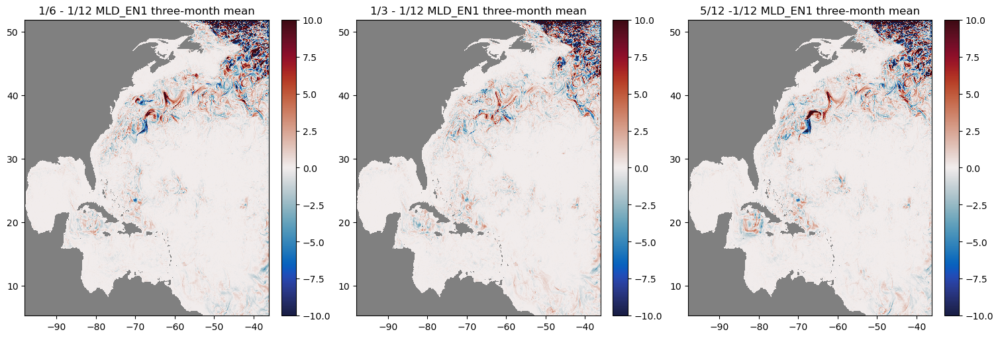

In [19]:
#nx_wave=ocean_daily_wave.variables['x']
# daMLD_EN1_12_ave=xarray.DataArray(MLD_EN1_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# daMLD_EN1_12_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/12 MLD_EN1 three-month mean')

# ###show the difference
# diff_MLD_EN1_6_ave=MLD_EN1_6_ave - MLD_EN1_12_ave
# da_diff_MLD_EN1_6=xarray.DataArray(diff_MLD_EN1_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_6.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/6 - Wave 1/12 MLD_EN1 three-month mean')
# plt.show()


# diff_MLD_EN1_3_ave=MLD_EN1_3_ave - MLD_EN1_12_ave
# da_diff_MLD_EN1_3=xarray.DataArray(diff_MLD_EN1_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_3.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/12 MLD_EN1 three-month mean')
# plt.show()

# diff_MLD_EN1_5_ave=MLD_EN1_5_ave - MLD_EN1_12_ave
# da_diff_MLD_EN1_5=xarray.DataArray(diff_MLD_EN1_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_5.plot(vmin=-10,vmax=10)
# plt.title('Wave 5/12 - Wave 1/12 MLD_EN1 three-month mean')
# plt.show()

# diff_MLD_EN1_36_ave=MLD_EN1_3_ave - MLD_EN1_6_ave
# da_diff_MLD_EN1_36=xarray.DataArray(diff_MLD_EN1_36_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_36.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/6 MLD_EN1 three-month mean')
# plt.show()

# ###show the difference
# diff_MLD_EN1_6_12_ave=MLD_EN1_6_12_ave - MLD_EN1_12_12_ave
# da_diff_MLD_EN1_6_12=xarray.DataArray(diff_MLD_EN1_6_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_6_12.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/6 - Wave 1/12 MLD_EN1 Jan mean')
# plt.show()


# diff_MLD_EN1_3_12_ave=MLD_EN1_3_12_ave - MLD_EN1_12_12_ave
# da_diff_MLD_EN1_3_12=xarray.DataArray(diff_MLD_EN1_3_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_3_12.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/12 MLD_EN1 Jan mean')
# plt.show()


# diff_MLD_EN1_36_12_ave=MLD_EN1_3_12_ave - MLD_EN1_6_12_ave
# da_diff_MLD_EN1_36_12=xarray.DataArray(diff_MLD_EN1_36_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_36_12.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/6 MLD_EN1 Jan mean')
# plt.show()
# ###show the difference
# diff_MLD_EN1_6_34_ave=MLD_EN1_6_34_ave - MLD_EN1_12_34_ave
# da_diff_MLD_EN1_6_34=xarray.DataArray(diff_MLD_EN1_6_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_6_34.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/6 - Wave 1/12 MLD_EN1 Feb mean')
# plt.show()


# diff_MLD_EN1_3_34_ave=MLD_EN1_3_34_ave - MLD_EN1_12_34_ave
# da_diff_MLD_EN1_3_34=xarray.DataArray(diff_MLD_EN1_3_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_3_34.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/12 MLD_EN1 Feb mean')
# plt.show()


# diff_MLD_EN1_36_34_ave=MLD_EN1_3_34_ave - MLD_EN1_6_34_ave
# da_diff_MLD_EN1_36_34=xarray.DataArray(diff_MLD_EN1_36_34_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_MLD_EN1_3_34.plot(vmin=-10,vmax=10)
# plt.title('Wave 1/3 - Wave 1/6 MLD_EN1 Feb mean')
# plt.show()

daMLD_EN1_12_ave=xarray.DataArray(MLD_EN1_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daMLD_EN1_6_ave=xarray.DataArray(MLD_EN1_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daMLD_EN1_5_ave=xarray.DataArray(MLD_EN1_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
daMLD_EN1_3_ave=xarray.DataArray(MLD_EN1_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_MLD_EN1_6_ave=MLD_EN1_6_ave - MLD_EN1_12_ave
da_diff_MLD_EN1_6=xarray.DataArray(diff_MLD_EN1_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_MLD_EN1_3_ave=MLD_EN1_3_ave - MLD_EN1_12_ave
da_diff_MLD_EN1_3=xarray.DataArray(diff_MLD_EN1_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_MLD_EN1_5_ave=MLD_EN1_5_ave - MLD_EN1_12_ave
da_diff_MLD_EN1_5=xarray.DataArray(diff_MLD_EN1_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})



fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, daMLD_EN1_12_ave, cmap=cmap, shading='auto')
axes[0].set_title('1/12 MLD_EN1 three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, daMLD_EN1_6_ave, cmap=cmap, shading='auto')
axes[1].set_title('1/6 MLD_EN1 three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, daMLD_EN1_3_ave, cmap=cmap, shading='auto')
axes[2].set_title('1/3 MLD_EN1 three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, daMLD_EN1_5_ave, cmap=cmap, shading='auto')
axes[3].set_title('5/12 MLD_EN1 three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_MLD_EN1_6_ave, cmap=cmap, shading='auto',vmin=-10,vmax=10)
axes[0].set_title('1/6 - 1/12 MLD_EN1 three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_MLD_EN1_3_ave, cmap=cmap, shading='auto',vmin=-10,vmax=10)
axes[1].set_title('1/3 - 1/12 MLD_EN1 three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_MLD_EN1_5_ave, cmap=cmap, shading='auto',vmin=-10,vmax=10)
axes[2].set_title('5/12 -1/12 MLD_EN1 three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()


Text(0.5, 1.0, 'Reference-wave(LT) with no ME modification with Wave 1/3 ssy three-month mean')

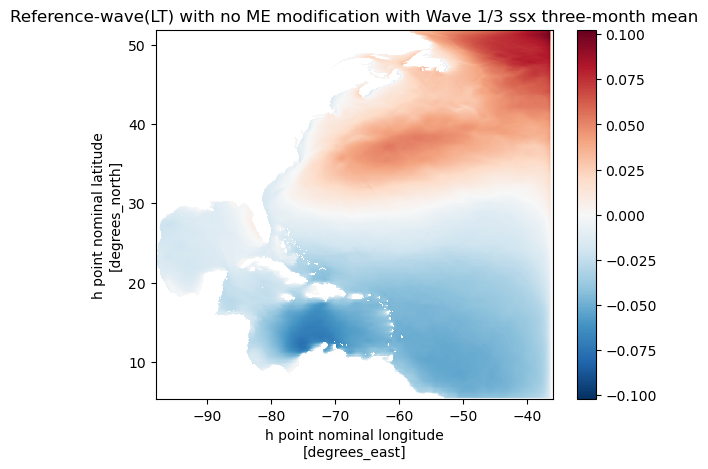

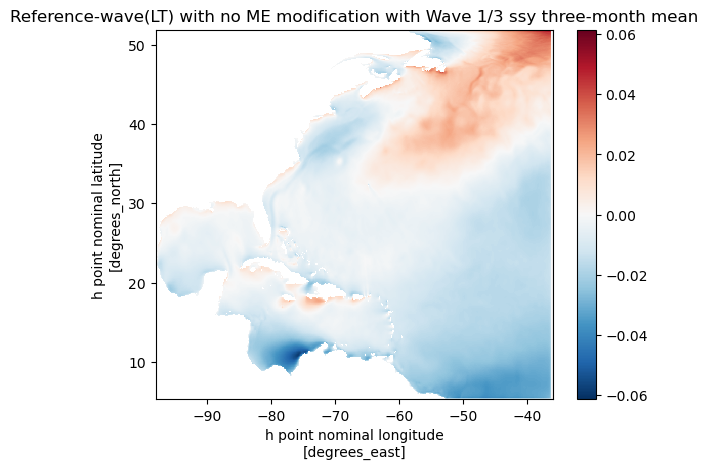

In [26]:
dassx_3_ave=xarray.DataArray(ssx_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
dassx_3_ave.plot()
plt.title('Reference-wave(LT) with no ME modification with Wave 1/3 ssx three-month mean')

dassy_3_ave=xarray.DataArray(ssy_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
dassy_3_ave.plot()
plt.title('Reference-wave(LT) with no ME modification with Wave 1/3 ssy three-month mean')

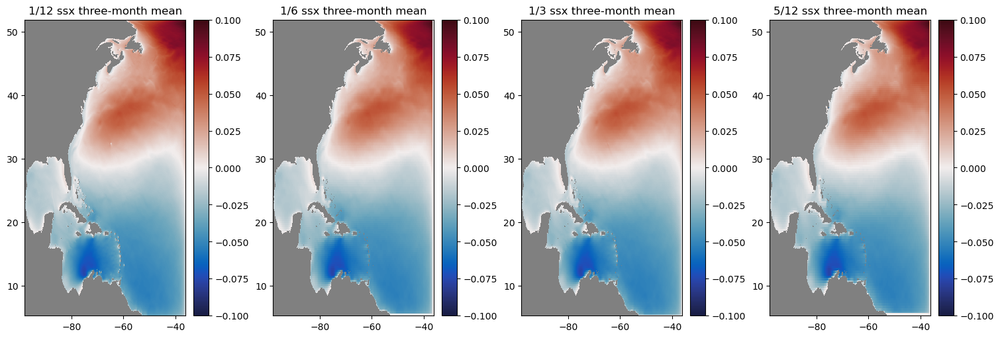

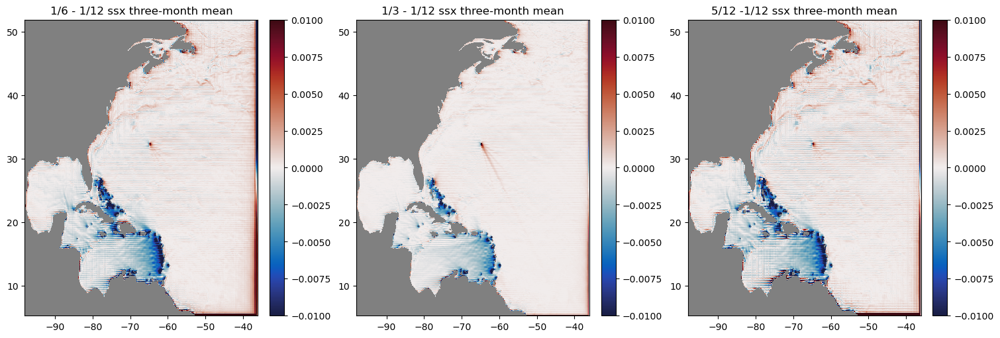

In [33]:
#nx_wave=ocean_daily_wave.variables['x']
# dassx_12_ave=xarray.DataArray(ssx_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassx_12_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/12 ssx three-month mean')

# dassx_6_ave=xarray.DataArray(ssx_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassx_6_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/6 ssx three-month mean')

# dassx_5_ave=xarray.DataArray(ssx_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassx_5_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 5/12 ssx three-month mean')

# dassx_3_ave=xarray.DataArray(ssx_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassx_3_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/3 ssx three-month mean')
# ###show the difference
# diff_ssx_6_ave=ssx_6_ave - ssx_12_ave
# da_diff_ssx_6=xarray.DataArray(diff_ssx_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssx_6.plot()
# plt.title('Wave 1/6 - Wave 1/12 ssx three-month mean')
# plt.show()


# diff_ssx_3_ave=ssx_3_ave - ssx_12_ave
# da_diff_ssx_3=xarray.DataArray(diff_ssx_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssx_3.plot()
# plt.title('Wave 1/3 - Wave 1/12 ssx three-month mean')
# plt.show()

# diff_ssx_5_ave=ssx_5_ave - ssx_12_ave
# da_diff_ssx_5=xarray.DataArray(diff_ssx_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssx_5.plot()
# plt.title('Wave 5/12 - Wave 1/12 ssx three-month mean')
# plt.show()

# diff_ssx_36_ave=ssx_3_ave - ssx_6_ave
# da_diff_ssx_36=xarray.DataArray(diff_ssx_36_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssx_36.plot()
# plt.title('Wave 1/3 - Wave 1/6 ssx three-month mean')
# plt.show()
dassx_12_ave=xarray.DataArray(ssx_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassx_6_ave=xarray.DataArray(ssx_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassx_5_ave=xarray.DataArray(ssx_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassx_3_ave=xarray.DataArray(ssx_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_ssx_6_ave=ssx_6_ave - ssx_12_ave
da_diff_ssx_6=xarray.DataArray(diff_ssx_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_ssx_3_ave=ssx_3_ave - ssx_12_ave
da_diff_ssx_3=xarray.DataArray(diff_ssx_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_ssx_5_ave=ssx_5_ave - ssx_12_ave
da_diff_ssx_5=xarray.DataArray(diff_ssx_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)
# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, dassx_12_ave, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[0].set_title('1/12 ssx three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, dassx_6_ave, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[1].set_title('1/6 ssx three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, dassx_3_ave, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[2].set_title('1/3 ssx three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, dassx_5_ave, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[3].set_title('5/12 ssx three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_ssx_6_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[0].set_title('1/6 - 1/12 ssx three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_ssx_3_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[1].set_title('1/3 - 1/12 ssx three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_ssx_5_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[2].set_title('5/12 - 1/12 ssx three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

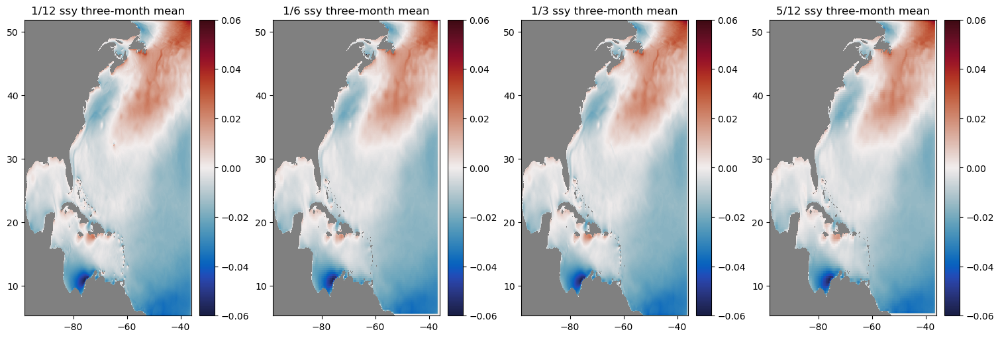

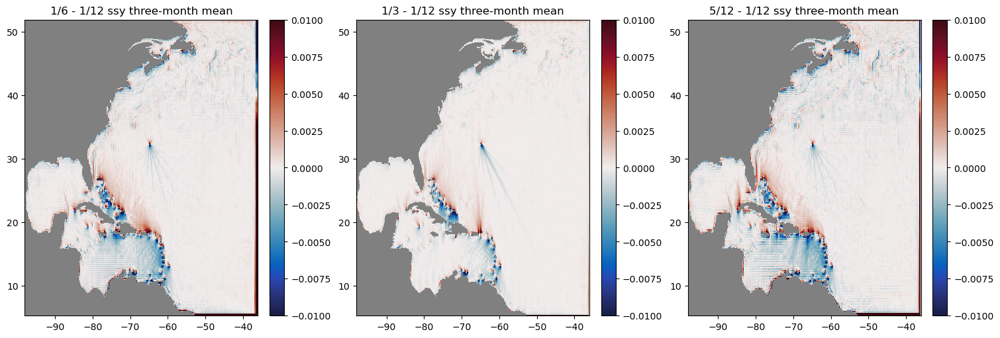

In [35]:
#nx_wave=ocean_daily_wave.variables['x']
# dassy_12_ave=xarray.DataArray(ssy_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassy_12_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/12 ssy three-month mean')

# dassy_6_ave=xarray.DataArray(ssy_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassy_6_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/6 ssy three-month mean')

# dassy_3_ave=xarray.DataArray(ssy_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# dassy_3_ave.plot()
# plt.title('Reference-wave(LT) with no ME modification with Wave 1/3 ssy three-month mean')

# ###show the difference
# diff_ssy_6_ave=ssy_6_ave - ssy_12_ave
# da_diff_ssy_6=xarray.DataArray(diff_ssy_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssy_6.plot()
# plt.title('Wave 1/6 - Wave 1/12 ssy three-month mean')
# plt.show()


# diff_ssy_3_ave=ssy_3_ave - ssy_12_ave
# da_diff_ssy_3=xarray.DataArray(diff_ssy_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssy_3.plot()
# plt.title('Wave 1/3 - Wave 1/12 ssy three-month mean')
# plt.show()



# diff_ssy_5_ave=ssy_5_ave - ssy_12_ave
# da_diff_ssy_5=xarray.DataArray(diff_ssy_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssy_5.plot()
# plt.title('Wave 1/3 - Wave 1/12 ssy three-month mean')
# plt.show()

# diff_ssy_36_ave=ssy_3_ave - ssy_6_ave
# da_diff_ssy_36=xarray.DataArray(diff_ssy_36_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_ssy_36.plot()
# plt.title('Wave 1/3 - Wave 1/6 ssy three-month mean')
# plt.show()
dassy_12_ave=xarray.DataArray(ssy_12_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassy_6_ave=xarray.DataArray(ssy_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassy_5_ave=xarray.DataArray(ssy_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
dassy_3_ave=xarray.DataArray(ssy_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
###show the difference
diff_ssy_6_ave=ssy_6_ave - ssy_12_ave
da_diff_ssy_6=xarray.DataArray(diff_ssy_6_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_ssy_3_ave=ssy_3_ave - ssy_12_ave
da_diff_ssy_3=xarray.DataArray(diff_ssy_3_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


diff_ssy_5_ave=ssy_5_ave - ssy_12_ave
da_diff_ssy_5=xarray.DataArray(diff_ssy_5_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})


fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)
# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, dassy_12_ave, cmap=cmap, shading='auto',vmin=-0.06,vmax=0.06)
axes[0].set_title('1/12 ssy three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, dassy_6_ave, cmap=cmap, shading='auto',vmin=-0.06,vmax=0.06)
axes[1].set_title('1/6 ssy three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, dassy_3_ave, cmap=cmap, shading='auto',vmin=-0.06,vmax=0.06)
axes[2].set_title('1/3 ssy three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(model_grid_x, model_grid_y, dassy_5_ave, cmap=cmap, shading='auto',vmin=-0.06,vmax=0.06)
axes[3].set_title('5/12 ssy three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_ssy_6_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[0].set_title('1/6 - 1/12 ssy three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_ssy_3_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[1].set_title('1/3 - 1/12 ssy three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_ssy_5_ave, cmap=cmap, shading='auto',vmin=-0.01,vmax=0.01)
axes[2].set_title('5/12 - 1/12 ssy three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

In [36]:
from netCDF4 import Dataset
import xarray as xr
def hs_mean_method(pp_root,model_grid_x,model_grid_y,date):
    date_str=str(date)
    date_2=str(date+1)
    date_3=str(date+2)
    date_4=str(date+3)
    
    ww3_1= Dataset(pp_root+"/WW3/PostProc/ww3."+date_str+".nc")
    ww3_2= Dataset(pp_root+"/WW3/PostProc/ww3."+date_2+".nc")
    ww3_3= Dataset(pp_root+"/WW3/PostProc/ww3."+date_3+".nc")
    ww3_4= Dataset(pp_root+"/WW3/PostProc/ww3."+date_4+".nc")
    lon_x=ww3_1.variables['longitude'][0,:]
    lat_y=ww3_1.variables['latitude'][:,0]
    model_grid_x=lon_x
    model_grid_y=lat_y
    # ww3_usp=Dataset(pp_root_wave+"ww3.199301_usp.nc")

    def hs_mean(ww3,model_grid_x,model_grid_y):    
        hs = ww3.variables['hs'][:]
        t = ww3.variables['time'][:]
        ucur=ww3.variables['ucur'][:]
        vcur=ww3.variables['vcur'][:]
        uwnd=ww3.variables['uwnd'][:]
        vwnd=ww3.variables['vwnd'][:]
        cur=np.sqrt(ucur**2 + vcur**2)
        wnd=np.sqrt(uwnd**2 + vwnd**2)        
        
        da_hs = xr.DataArray(
            hs,
            dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
            coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='hs'  # Optional: Give the variable a name
        )
        hs_mean = da_hs.mean(dim='time')

        da_cur = xr.DataArray(
            cur,
            dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
            coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='cur'  # Optional: Give the variable a name
        )
        cur_mean = da_cur.mean(dim='time')

        da_wnd = xr.DataArray(
            wnd,
            dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
            coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='wnd'  # Optional: Give the variable a name
        )
        wnd_mean = da_wnd.mean(dim='time')
        
        return hs_mean, cur_mean, wnd_mean
    def hs_mean_singleday(ww3,model_grid_x,model_grid_y):
    
        hs = ww3.variables['hs'][:]
        hs=hs[0,:,:]
        t = ww3.variables['time'][:]
        ucur=ww3.variables['ucur'][:]
        vcur=ww3.variables['vcur'][:]
        uwnd=ww3.variables['uwnd'][:]
        vwnd=ww3.variables['vwnd'][:]
        cur=np.sqrt(ucur**2 + vcur**2)
        cur=cur[0,:,:]
        wnd=np.sqrt(uwnd**2 + vwnd**2) 
        wnd=wnd[0,:,:]
        
        da_hs = xr.DataArray(
            hs,
            dims=['yh', 'xh'],  # Adjust based on your variable's shape
            coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='hs'  # Optional: Give the variable a name
        )
        hs_mean = da_hs

        da_cur = xr.DataArray(
            cur,
            dims=['yh', 'xh'],  # Adjust based on your variable's shape
            coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='cur'  # Optional: Give the variable a name
        )
        cur_mean = da_cur

        da_wnd = xr.DataArray(
            wnd,
            dims=[ 'yh', 'xh'],  # Adjust based on your variable's shape
            coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
            name='wnd'  # Optional: Give the variable a name
        )
        wnd_mean = da_wnd
        
        return hs_mean, cur_mean, wnd_mean
        
    hs_mean_1,cur_mean_1, wnd_mean_1=hs_mean(ww3_1,model_grid_x,model_grid_y)
    hs_mean_2,cur_mean_2, wnd_mean_2=hs_mean(ww3_2,model_grid_x,model_grid_y)
    hs_mean_3,cur_mean_3, wnd_mean_3=hs_mean(ww3_3,model_grid_x,model_grid_y)
    hs_mean_4,cur_mean_4, wnd_mean_4=hs_mean_singleday(ww3_4,model_grid_x,model_grid_y)    

    hs_mean_method=(hs_mean_1+hs_mean_2+hs_mean_3+hs_mean_4)/4
 

    cur_mean_method=(cur_mean_1+cur_mean_2+cur_mean_3+cur_mean_4)/4
   

    wnd_mean_method=(wnd_mean_1+wnd_mean_2+wnd_mean_3+wnd_mean_4)/4

    
    return hs_mean_1,hs_mean_2,hs_mean_method,wnd_mean_1,wnd_mean_2,wnd_mean_method,cur_mean_1,cur_mean_2,cur_mean_method

def hs_mean_annual(pp_root,model_grid_x,model_grid_y):
    _,_,hs_mean_1,_,_,wnd_mean_1,_,_,cur_mean_1=hs_mean_method(pp_root,model_grid_x,model_grid_y,199301)   
   
    return hs_mean_1, wnd_mean_1, cur_mean_1


    
hs_mean_12,wnd_mean_12, cur_mean_12=hs_mean_annual(pp_root_12,model_grid_x,model_grid_y)    
hs_mean_6,wnd_mean_6, cur_mean_6=hs_mean_annual(pp_root_6,model_grid_x,model_grid_y)    
hs_mean_3,wnd_mean_3, cur_mean_3=hs_mean_annual(pp_root_3,model_grid_x,model_grid_y) 
hs_mean_5,wnd_mean_5, cur_mean_5=hs_mean_annual(pp_root_5,model_grid_x,model_grid_y) 


/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(

In [7]:
# from netCDF4 import Dataset
# import xarray as xr
# def hs_mean_method(pp_root,model_grid_x,model_grid_y,date):
#     date_str=str(date)
#     date_2=str(date+1)
#     date_3=str(date+2)
#     date_4=str(date+3)
    
#     ww3_1= Dataset(pp_root+"/WW3/PostProc/ww3."+date_str+".nc")
#     ww3_2= Dataset(pp_root+"/WW3/PostProc/ww3."+date_2+".nc")
#     ww3_3= Dataset(pp_root+"/WW3/PostProc/ww3."+date_3+".nc")
#     ww3_4= Dataset(pp_root+"/WW3/PostProc/ww3."+date_4+".nc")
#     lon_x=ww3_1.variables['longitude'][0,:]
#     lat_y=ww3_1.variables['latitude'][:,0]
#     model_grid_x=lon_x
#     model_grid_y=lat_y
#     # ww3_usp=Dataset(pp_root_wave+"ww3.199301_usp.nc")
#     def hs_mean(ww3,model_grid_x,model_grid_y):
    
#         hs = ww3.variables['hs'][:]
#         t = ww3.variables['time'][:]
#         ucur=ww3.variables['ucur'][:]
#         vcur=ww3.variables['vcur'][:]
#         uwnd=ww3.variables['uwnd'][:]
#         vwnd=ww3.variables['vwnd'][:]
#         cur=np.sqrt(ucur**2 + vcur**2)
#         wnd=np.sqrt(uwnd**2 + vwnd**2)        
        
#         da_hs = xr.DataArray(
#             hs,
#             dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
#             coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='hs'  # Optional: Give the variable a name
#         )
#         hs_mean = da_hs.mean(dim='time')

#         da_cur = xr.DataArray(
#             cur,
#             dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
#             coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='cur'  # Optional: Give the variable a name
#         )
#         cur_mean = da_cur.mean(dim='time')

#         da_wnd = xr.DataArray(
#             wnd,
#             dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
#             coords={'time': t, 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='wnd'  # Optional: Give the variable a name
#         )
#         wnd_mean = da_wnd.mean(dim='time')
        
#         return hs_mean, cur_mean, wnd_mean
#     def hs_mean_singleday(ww3,model_grid_x,model_grid_y):
    
#         hs = ww3.variables['hs'][:]
#         hs=hs[0,:,:]
#         t = ww3.variables['time'][:]
#         ucur=ww3.variables['ucur'][:]
#         vcur=ww3.variables['vcur'][:]
#         uwnd=ww3.variables['uwnd'][:]
#         vwnd=ww3.variables['vwnd'][:]
#         cur=np.sqrt(ucur**2 + vcur**2)
#         cur=cur[0,:,:]
#         wnd=np.sqrt(uwnd**2 + vwnd**2) 
#         wnd=wnd[0,:,:]
        
#         da_hs = xr.DataArray(
#             hs,
#             dims=['yh', 'xh'],  # Adjust based on your variable's shape
#             coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='hs'  # Optional: Give the variable a name
#         )
#         hs_mean = da_hs

#         da_cur = xr.DataArray(
#             cur,
#             dims=['yh', 'xh'],  # Adjust based on your variable's shape
#             coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='cur'  # Optional: Give the variable a name
#         )
#         cur_mean = da_cur

#         da_wnd = xr.DataArray(
#             wnd,
#             dims=[ 'yh', 'xh'],  # Adjust based on your variable's shape
#             coords={ 'xh': model_grid_x, 'yh': model_grid_y},  # Define coordinates
#             name='wnd'  # Optional: Give the variable a name
#         )
#         wnd_mean = da_wnd
        
#         return hs_mean, cur_mean, wnd_mean
        
#     hs_mean_1,cur_mean_1, wnd_mean_1=hs_mean(ww3_1,model_grid_x,model_grid_y)
#     hs_mean_2,cur_mean_2, wnd_mean_2=hs_mean(ww3_2,model_grid_x,model_grid_y)
#     hs_mean_3,cur_mean_3, wnd_mean_3=hs_mean(ww3_3,model_grid_x,model_grid_y)
#     hs_mean_4,cur_mean_4, wnd_mean_4=hs_mean_singleday(ww3_4,model_grid_x,model_grid_y)    

#     hs_mean_method=(hs_mean_1+hs_mean_2+hs_mean_3+hs_mean_4)/4
 

#     cur_mean_method=(cur_mean_1+cur_mean_2+cur_mean_3+cur_mean_4)/4
   

#     wnd_mean_method=(wnd_mean_1+wnd_mean_2+wnd_mean_3+wnd_mean_4)/4

    
#     return hs_mean_1,hs_mean_2,hs_mean_method,wnd_mean_1,wnd_mean_2,wnd_mean_method,cur_mean_1,cur_mean_2,cur_mean_method

# def hs_mean_annual(pp_root,model_grid_x,model_grid_y):
#     _,_,hs_mean_1,_,_,wnd_mean_1,_,_,cur_mean_1=hs_mean_method(pp_root,model_grid_x,model_grid_y,199301)   
   
#     return hs_mean_1, wnd_mean_1, cur_mean_1


    
# hs_mean_12,wnd_mean_12, cur_mean_12=hs_mean_annual(pp_root_12,model_grid_x,model_grid_y)    
# hs_mean_6,wnd_mean_6, cur_mean_6=hs_mean_annual(pp_root_6,model_grid_x,model_grid_y)    
# hs_mean_3,wnd_mean_3, cur_mean_3=hs_mean_annual(pp_root_3,model_grid_x,model_grid_y) 


/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)
/ncrc/home1/Qian.Xiao/.conda/envs/mom6py/lib/python3.12/site-packages/numpy/ma/core.py:6980: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(

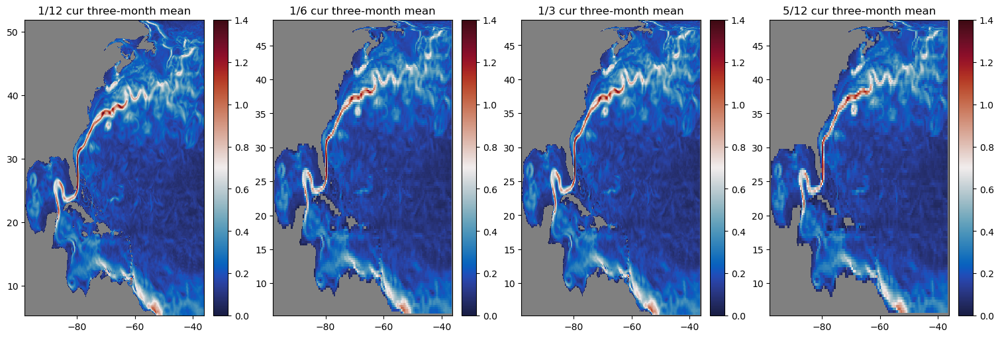

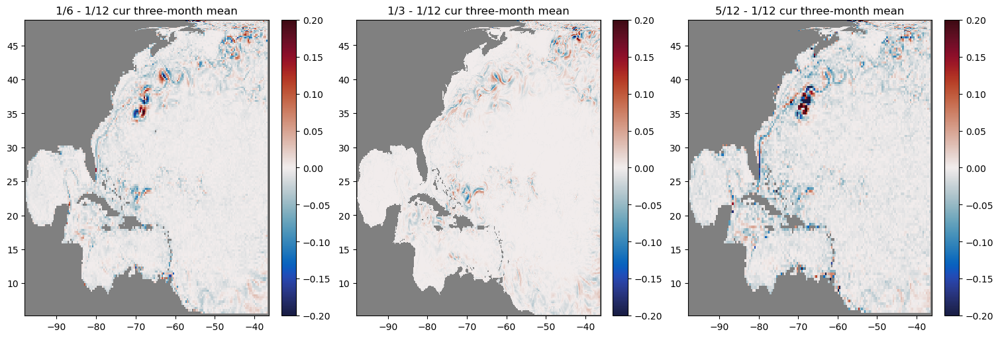

In [46]:
cur_12_on_6_grid = cur_mean_12.interp(xh=cur_mean_6.xh, yh=cur_mean_6.yh)
cur_diff_6 = cur_mean_6 - cur_12_on_6_grid

cur_12_on_3_grid = cur_mean_12.interp(xh=cur_mean_3.xh, yh=cur_mean_3.yh)
cur_diff_3 = cur_mean_3 - cur_12_on_3_grid

cur_12_on_5_grid = cur_mean_12.interp(xh=cur_mean_5.xh, yh=cur_mean_5.yh)
cur_diff_5 = cur_mean_5 - cur_12_on_5_grid

fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)
# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, cur_mean_12, cmap=cmap, shading='auto', vmin=0,vmax=1.4)
axes[0].set_title('1/12 cur three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(cur_mean_6.xh, cur_mean_6.yh, cur_mean_6, cmap=cmap, shading='auto',vmin=0,vmax=1.4)
axes[1].set_title('1/6 cur three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(cur_mean_3.xh, cur_mean_3.yh, cur_mean_3, cmap=cmap, shading='auto',vmin=0,vmax=1.4)
axes[2].set_title('1/3 cur three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(cur_mean_5.xh, cur_mean_5.yh, cur_mean_5, cmap=cmap, shading='auto',vmin=0,vmax=1.4)
axes[3].set_title('5/12 cur three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(cur_mean_6.xh, cur_mean_6.yh, cur_diff_6, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[0].set_title('1/6 - 1/12 cur three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(cur_mean_3.xh, cur_mean_3.yh, cur_diff_3, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[1].set_title('1/3 - 1/12 cur three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(cur_mean_5.xh, cur_mean_5.yh, cur_diff_5, cmap=cmap, shading='auto',vmin=-0.2,vmax=0.2)
axes[2].set_title('5/12 - 1/12 cur three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

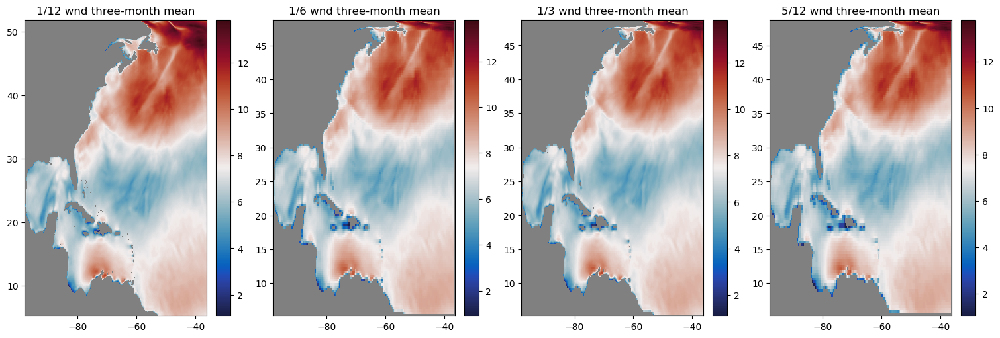

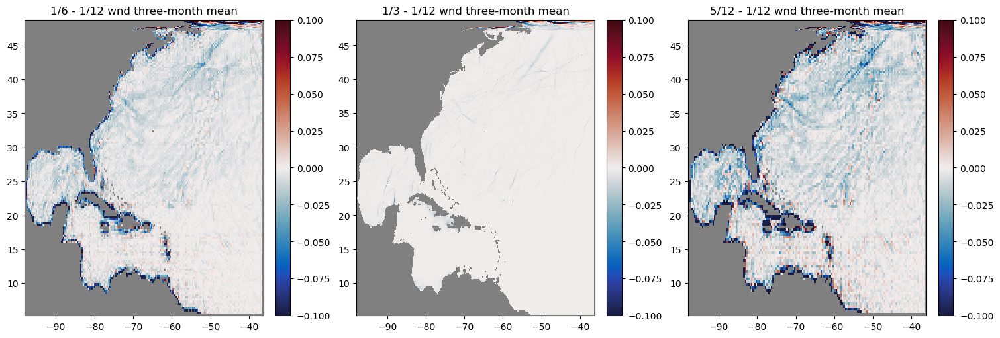

In [44]:
wnd_12_on_6_grid = wnd_mean_12.interp(xh=wnd_mean_6.xh, yh=wnd_mean_6.yh)
wnd_diff_6 = wnd_mean_6 - wnd_12_on_6_grid

wnd_12_on_3_grid = wnd_mean_12.interp(xh=wnd_mean_3.xh, yh=wnd_mean_3.yh)
wnd_diff_3 = wnd_mean_3 - wnd_12_on_3_grid

wnd_12_on_5_grid = wnd_mean_12.interp(xh=wnd_mean_5.xh, yh=wnd_mean_5.yh)
wnd_diff_5 = wnd_mean_5 - wnd_12_on_5_grid

fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)
# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, wnd_mean_12, cmap=cmap, shading='auto')
axes[0].set_title('1/12 wnd three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(wnd_mean_6.xh, wnd_mean_6.yh, wnd_mean_6, cmap=cmap, shading='auto')
axes[1].set_title('1/6 wnd three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(wnd_mean_3.xh, wnd_mean_3.yh, wnd_mean_3, cmap=cmap, shading='auto')
axes[2].set_title('1/3 wnd three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(wnd_mean_5.xh, wnd_mean_5.yh, wnd_mean_5, cmap=cmap, shading='auto')
axes[3].set_title('5/12 wnd three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(wnd_mean_6.xh, wnd_mean_6.yh, wnd_diff_6, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[0].set_title('1/6 - 1/12 wnd three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(wnd_mean_3.xh, wnd_mean_3.yh, wnd_diff_3, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[1].set_title('1/3 - 1/12 wnd three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(wnd_mean_5.xh, wnd_mean_5.yh, wnd_diff_5, cmap=cmap, shading='auto',vmin=-0.1,vmax=0.1)
axes[2].set_title('5/12 - 1/12 wnd three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()


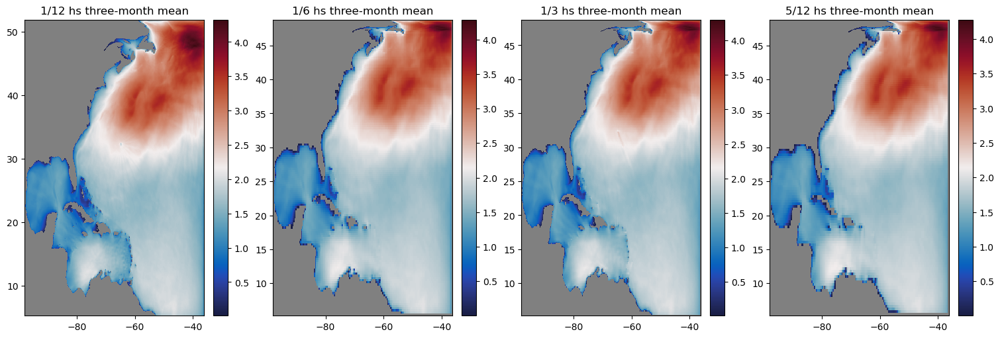

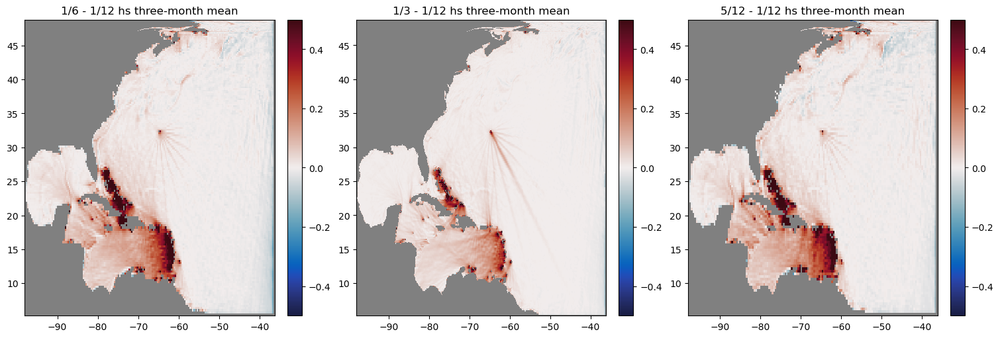

In [42]:
# Interpolate hs_12 to hs_6 grid
hs_12_on_6_grid = hs_mean_12.interp(xh=hs_mean_6.xh, yh=hs_mean_6.yh)
hs_diff_6 = hs_mean_6 - hs_12_on_6_grid

hs_12_on_3_grid = hs_mean_12.interp(xh=hs_mean_3.xh, yh=hs_mean_3.yh)
hs_diff_3 = hs_mean_3 - hs_12_on_3_grid

hs_12_on_5_grid = hs_mean_12.interp(xh=hs_mean_5.xh, yh=hs_mean_5.yh)
hs_diff_5 = hs_mean_5 - hs_12_on_5_grid

fig, axes = plt.subplots(1, 4, figsize=(15, 5), constrained_layout=True)
# Plot the first dataset
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, hs_mean_12, cmap=cmap, shading='auto')
axes[0].set_title('1/12 hs three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(hs_mean_6.xh, hs_mean_6.yh, hs_mean_6, cmap=cmap, shading='auto')
axes[1].set_title('1/6 hs three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(hs_mean_3.xh, hs_mean_3.yh, hs_mean_3, cmap=cmap, shading='auto')
axes[2].set_title('1/3 hs three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

mesh4 = axes[3].pcolormesh(hs_mean_5.xh, hs_mean_5.yh, hs_mean_5, cmap=cmap, shading='auto')
axes[3].set_title('5/12 hs three-month mean')
plt.colorbar(mesh4, ax=axes[3])  # Add colorbar for the second plot

# Show the plot
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the first dataset
mesh1 = axes[0].pcolormesh(hs_mean_6.xh, hs_mean_6.yh, hs_diff_6, cmap=cmap, shading='auto',vmin=-0.5,vmax=0.5)
axes[0].set_title('1/6 - 1/12 hs three-month mean')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(hs_mean_3.xh, hs_mean_3.yh, hs_diff_3, cmap=cmap, shading='auto',vmin=-0.5,vmax=0.5)
axes[1].set_title('1/3 - 1/12 hs three-month mean')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(hs_mean_5.xh, hs_mean_5.yh, hs_diff_5, cmap=cmap, shading='auto',vmin=-0.5,vmax=0.5)
axes[2].set_title('5/12 - 1/12 hs three-month mean')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot

plt.show()

# plt.figure()
# hs_mean_12.plot()
# plt.title('Reference-wave(LT) with no ME modification Hs 1993 first three month mean')
# plt.show()
# plt.figure()



# plt.figure()
# hs_diff_6.plot()
# plt.title('wave 1/6 - wave 1/12 Hs first three month mean')
# plt.show()



# # diff_hs_3=hs_mean_3 - hs_mean_12
# plt.figure()
# hs_diff_3.plot()
# plt.title('wave 1/3 - wave 1/12 Hs first three month mean')
# plt.show()


# hs_6_on_3_grid = hs_mean_6.interp(xh=hs_mean_3.xh, yh=hs_mean_3.yh)

# # Perform subtraction
# hs_diff_36 = hs_mean_3 - hs_6_on_3_grid

# # diff_hs_36=hs_mean_3 - hs_mean_6
# plt.figure()
# hs_diff_36.plot()
# plt.title('wave 1/3 - wave 1/6 Hs first three month mean')
# plt.show()


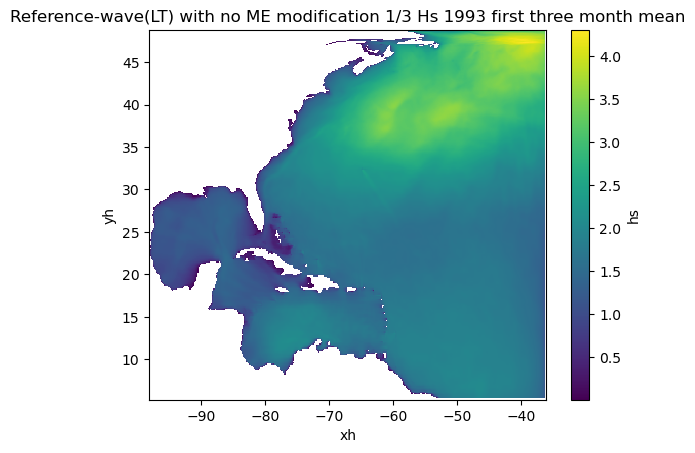

<Figure size 640x480 with 0 Axes>

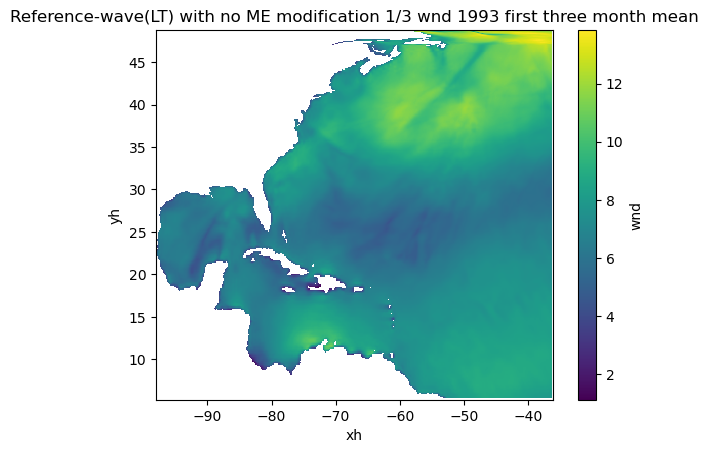

<Figure size 640x480 with 0 Axes>

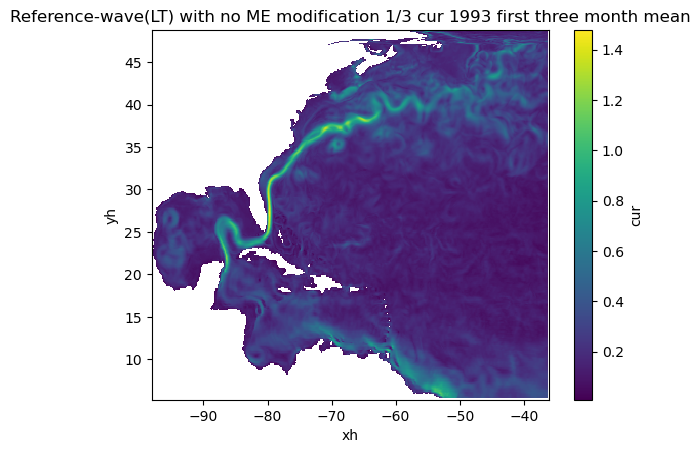

<Figure size 640x480 with 0 Axes>

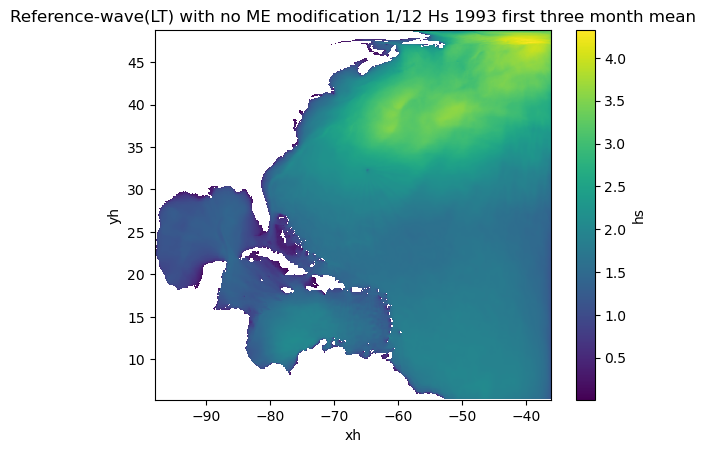

<Figure size 640x480 with 0 Axes>

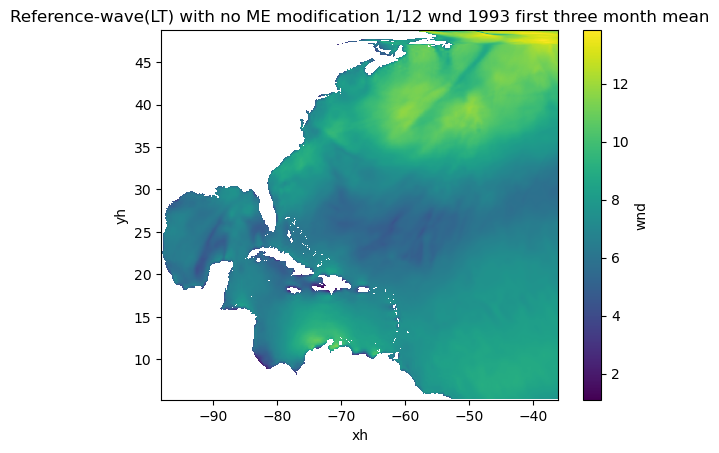

<Figure size 640x480 with 0 Axes>

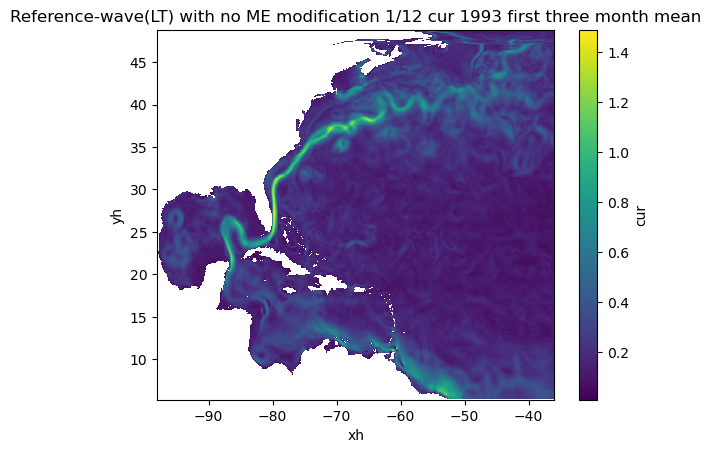

<Figure size 640x480 with 0 Axes>

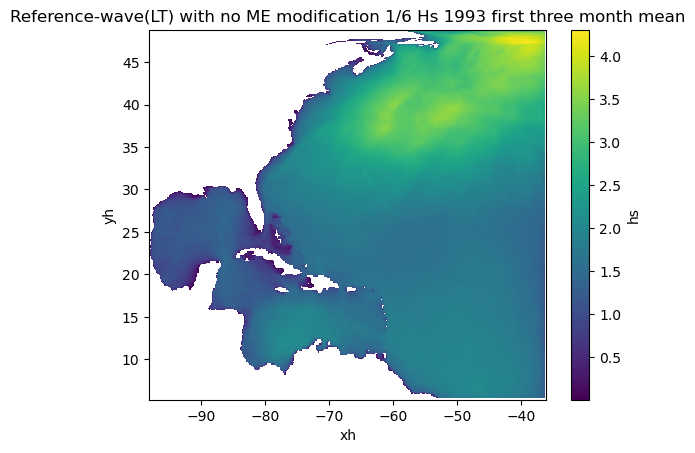

<Figure size 640x480 with 0 Axes>

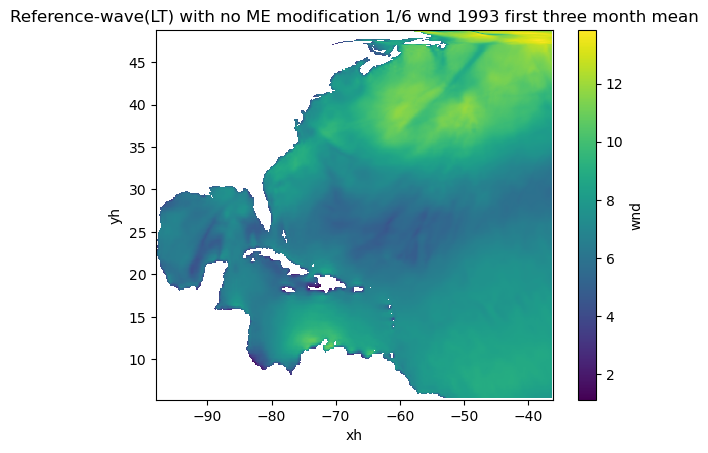

<Figure size 640x480 with 0 Axes>

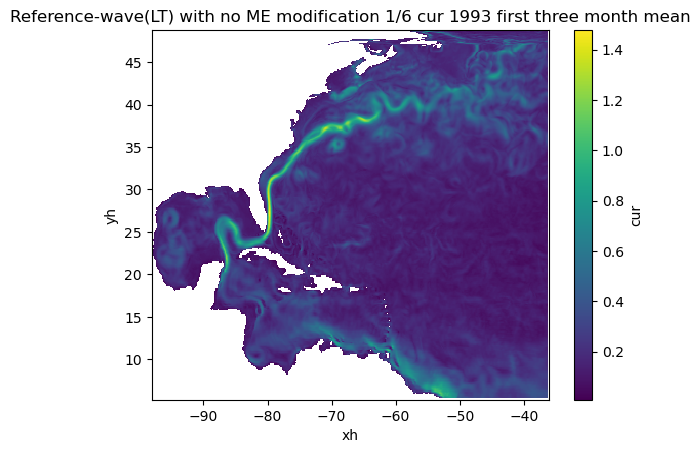

<Figure size 640x480 with 0 Axes>

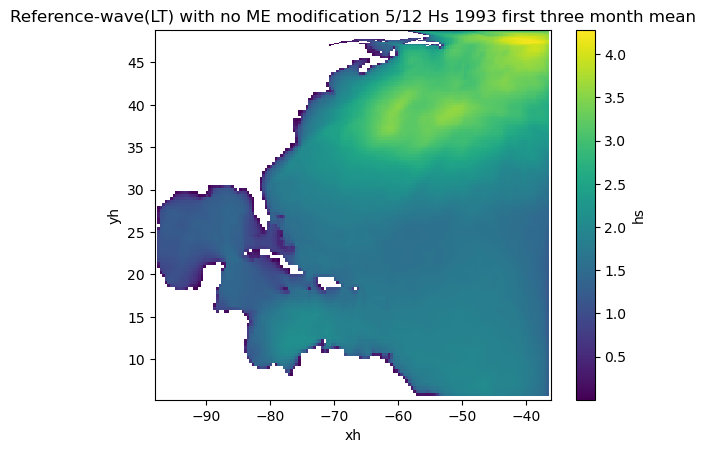

<Figure size 640x480 with 0 Axes>

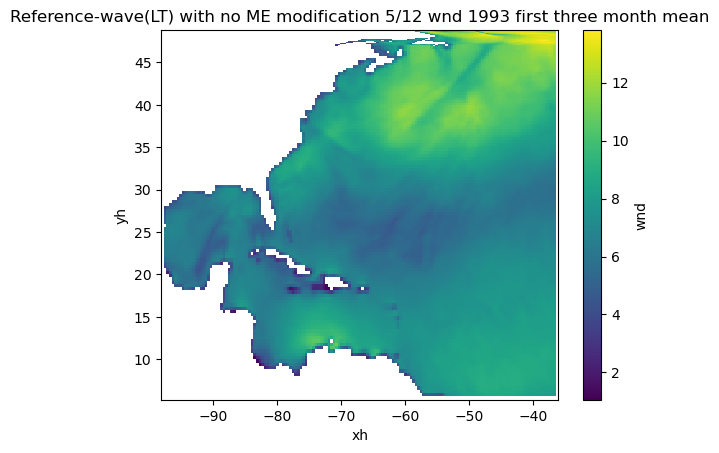

<Figure size 640x480 with 0 Axes>

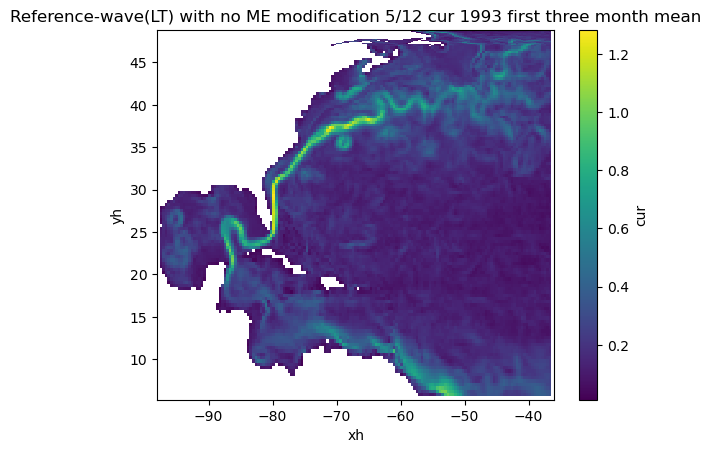

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [6]:
plt.figure()
hs_mean_3.plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 Hs 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
wnd_mean_3.plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 wnd 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
cur_mean_3.plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 cur 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
hs_mean_12.plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 Hs 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
wnd_mean_12.plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 wnd 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
cur_mean_12.plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 cur 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
hs_mean_6.plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 Hs 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
wnd_mean_6.plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 wnd 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
cur_mean_6.plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 cur 1993 first three month mean')
plt.show()
plt.figure()


plt.figure()
hs_mean_5.plot()
plt.title('Reference-wave(LT) with no ME modification 5/12 Hs 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
wnd_mean_5.plot()
plt.title('Reference-wave(LT) with no ME modification 5/12 wnd 1993 first three month mean')
plt.show()
plt.figure()

plt.figure()
cur_mean_5.plot()
plt.title('Reference-wave(LT) with no ME modification 5/12 cur 1993 first three month mean')
plt.show()
plt.figure()
# diff_O_W_12=SS_mag_12_ave-cur_mean_12
# da_diff_O_W_12=xarray.DataArray(diff_O_W_12, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_O_W_12.plot()
# plt.title('1/12 Ocean model - wave model SS_mag three month mean')

# diff_O_W_6=SS_mag_6_ave-cur_mean_6
# da_diff_O_W_6=xarray.DataArray(diff_O_W_6, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_O_W_6.plot()
# plt.title('1/6 Ocean model - wave model SS_mag three month mean')

# diff_O_W_3=SS_mag_3_ave-cur_mean_3
# da_diff_O_W_3=xarray.DataArray(diff_O_W_3, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
# plt.figure()
# da_diff_O_W_3.plot()
# plt.title('1/3 Ocean model - wave model SS_mag three month mean')

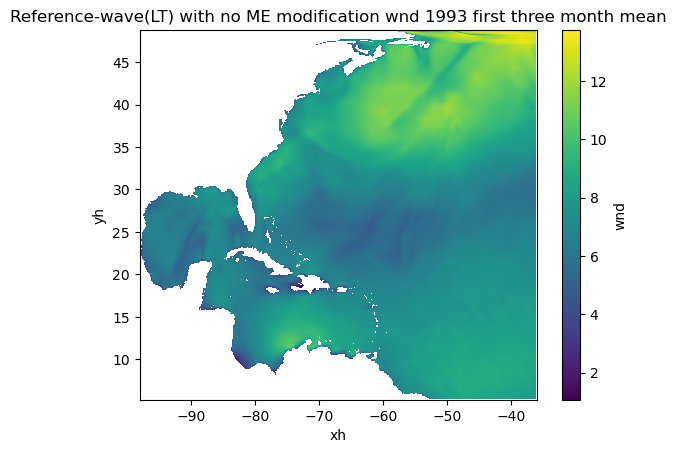

<Figure size 640x480 with 0 Axes>

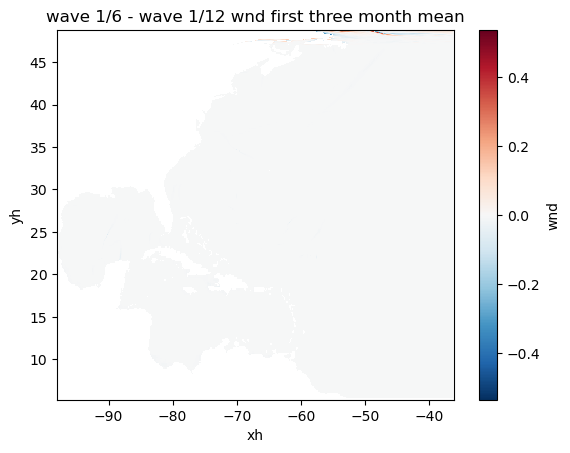

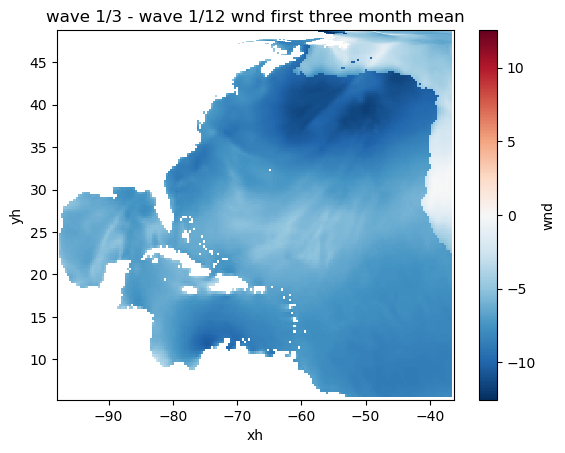

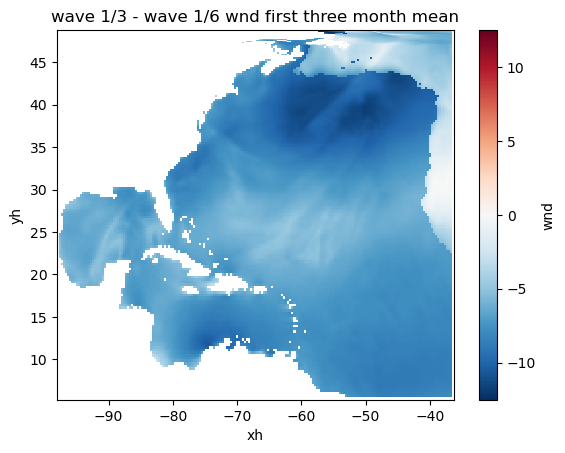

In [10]:
wnd_12_on_6_grid = wnd_mean_12.interp(xh=wnd_mean_6.xh, yh=wnd_mean_6.yh)

# Perform subtraction
wnd_diff_6 = wnd_mean_6 - wnd_12_on_6_grid

plt.figure()
wnd_mean_12.plot()
plt.title('Reference-wave(LT) with no ME modification wnd 1993 first three month mean')
plt.show()
plt.figure()



plt.figure()
wnd_diff_6.plot()
plt.title('wave 1/6 - wave 1/12 wnd first three month mean')
plt.show()

wnd_12_on_3_grid = wnd_mean_12.interp(xh=wnd_mean_3.xh, yh=wnd_mean_3.yh)

# Perform subtraction
wnd_diff_3 = wnd_mean_3 - wnd_12_on_3_grid

# diff_wnd_3=wnd_mean_3 - wnd_mean_12
plt.figure()
wnd_diff_3.plot()
plt.title('wave 1/3 - wave 1/12 wnd first three month mean')
plt.show()


wnd_6_on_3_grid = wnd_mean_6.interp(xh=wnd_mean_3.xh, yh=wnd_mean_3.yh)

# Perform subtraction
wnd_diff_36 = wnd_mean_3 - wnd_6_on_3_grid

# diff_wnd_36=wnd_mean_3 - wnd_mean_6
plt.figure()
wnd_diff_36.plot()
plt.title('wave 1/3 - wave 1/6 wnd first three month mean')
plt.show()

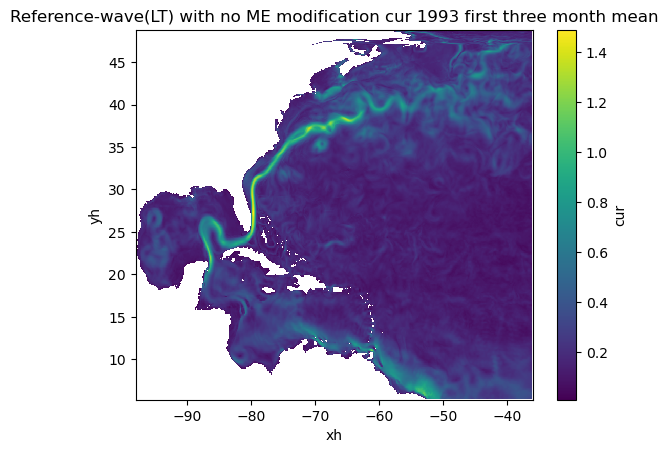

<Figure size 640x480 with 0 Axes>

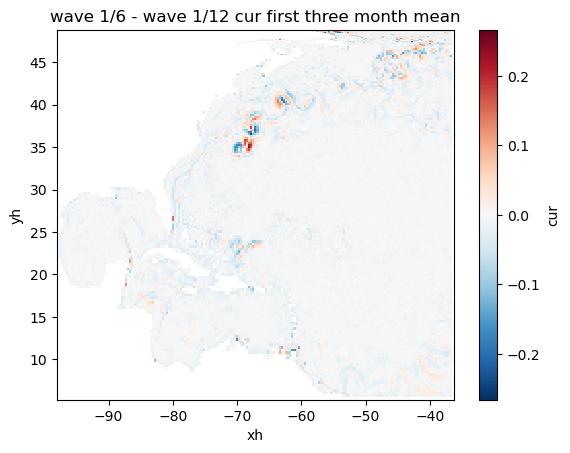

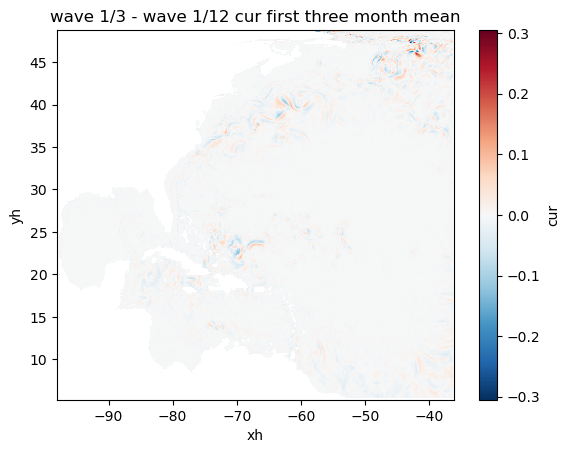

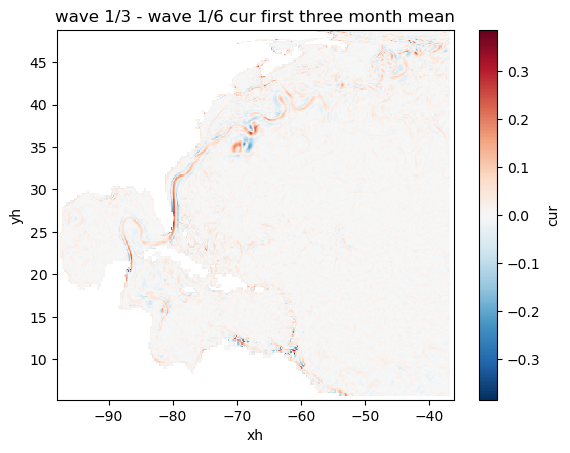

In [25]:
cur_12_on_6_grid = cur_mean_12.interp(xh=cur_mean_6.xh, yh=cur_mean_6.yh)

# Perform subtraction
cur_diff_6 = cur_mean_6 - cur_12_on_6_grid

plt.figure()
cur_mean_12.plot()
plt.title('Reference-wave(LT) with no ME modification cur 1993 first three month mean')
plt.show()
plt.figure()



plt.figure()
cur_diff_6.plot()
plt.title('wave 1/6 - wave 1/12 cur first three month mean')
plt.show()

cur_12_on_3_grid = cur_mean_12.interp(xh=cur_mean_3.xh, yh=cur_mean_3.yh)

# Perform subtraction
cur_diff_3 = cur_mean_3 - cur_12_on_3_grid

# diff_cur_3=cur_mean_3 - cur_mean_12
plt.figure()
cur_diff_3.plot()
plt.title('wave 1/3 - wave 1/12 cur first three month mean')
plt.show()


cur_6_on_3_grid = cur_mean_6.interp(xh=cur_mean_3.xh, yh=cur_mean_3.yh)

# Perform subtraction
cur_diff_36 = cur_mean_3 - cur_6_on_3_grid

# diff_cur_36=cur_mean_3 - cur_mean_6
plt.figure()
cur_diff_36.plot()
plt.title('wave 1/3 - wave 1/6 cur first three month mean')
plt.show()

In [24]:
root_12="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling_ZC/examples/NWA12.COBALT_all_16hours/WW3/PostProc/ww3.199301.nc"
root_6="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling_ZC/examples/NWA12.COBALT_all_wavehgrid/WW3/PostProc/ww3.199301.nc"
root_3="/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling_ZC/examples/NWA12.COBALT_all_wave1_3/WW3/PostProc/ww3.199301.nc"

ww3_12= Dataset(root_12)
ww3_6= Dataset(root_6)
ww3_3= Dataset(root_3)
hs_12 = ww3_12.variables['hs'][:]
ucur_12=ww3_12.variables['ucur'][:]
vcur_12=ww3_12.variables['vcur'][:]
uwnd_12=ww3_12.variables['uwnd'][:]
vwnd_12=ww3_12.variables['vwnd'][:]
cur_12=np.sqrt(ucur_12**2 + vcur_12**2)
wnd_12=np.sqrt(uwnd_12**2 + vwnd_12**2)        
model_grid_x_12=ww3_12.variables['longitude'][0,:]
model_grid_y_12=ww3_12.variables['latitude'][:,0]
t_12 = ww3_12.variables['time'][:]
da_hs_12 = xr.DataArray(
    hs_12,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_12, 'xh': model_grid_x_12, 'yh': model_grid_y_12},  # Define coordinates
    name='hs'  # Optional: Give the variable a name
)

da_cur_12 = xr.DataArray(
    cur_12,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_12, 'xh': model_grid_x_12, 'yh': model_grid_y_12},  # Define coordinates
    name='cur'  # Optional: Give the variable a name
)

da_wnd_12 = xr.DataArray(
    wnd_12,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_12, 'xh': model_grid_x_12, 'yh': model_grid_y_12},  # Define coordinates
    name='wnd'  # Optional: Give the variable a name
)


hs_6 = ww3_6.variables['hs'][:]
ucur_6=ww3_6.variables['ucur'][:]
vcur_6=ww3_6.variables['vcur'][:]
uwnd_6=ww3_6.variables['uwnd'][:]
vwnd_6=ww3_6.variables['vwnd'][:]
cur_6=np.sqrt(ucur_6**2 + vcur_6**2)
wnd_6=np.sqrt(uwnd_6**2 + vwnd_6**2)        
model_grid_x_6=ww3_6.variables['longitude'][0,:]
model_grid_y_6=ww3_6.variables['latitude'][:,0]
t_6 = ww3_6.variables['time'][:]
da_hs_6 = xr.DataArray(
    hs_6,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_6, 'xh': model_grid_x_6, 'yh': model_grid_y_6},  # Define coordinates
    name='hs'  # Optional: Give the variable a name
)

da_cur_6 = xr.DataArray(
    cur_6,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_6, 'xh': model_grid_x_6, 'yh': model_grid_y_6},  # Define coordinates
    name='cur'  # Optional: Give the variable a name
)

da_wnd_6 = xr.DataArray(
    wnd_6,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_6, 'xh': model_grid_x_6, 'yh': model_grid_y_6},  # Define coordinates
    name='wnd'  # Optional: Give the variable a name
)

hs_3 = ww3_3.variables['hs'][:]
ucur_3=ww3_3.variables['ucur'][:]
vcur_3=ww3_3.variables['vcur'][:]
uwnd_3=ww3_3.variables['uwnd'][:]
vwnd_3=ww3_3.variables['vwnd'][:]
cur_3=np.sqrt(ucur_3**2 + vcur_3**2)
wnd_3=np.sqrt(uwnd_3**2 + vwnd_3**2)        
model_grid_x_3=ww3_3.variables['longitude'][0,:]
model_grid_y_3=ww3_3.variables['latitude'][:,0]
t_3 = ww3_3.variables['time'][:]
da_hs_3 = xr.DataArray(
    hs_3,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_3, 'xh': model_grid_x_3, 'yh': model_grid_y_3},  # Define coordinates
    name='hs'  # Optional: Give the variable a name
)

da_cur_3 = xr.DataArray(
    cur_3,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_3, 'xh': model_grid_x_3, 'yh': model_grid_y_3},  # Define coordinates
    name='cur'  # Optional: Give the variable a name
)

da_wnd_3 = xr.DataArray(
    wnd_3,
    dims=['time', 'yh', 'xh'],  # Adjust based on your variable's shape
    coords={'time': t_3, 'xh': model_grid_x_3, 'yh': model_grid_y_3},  # Define coordinates
    name='wnd'  # Optional: Give the variable a name
)


FileNotFoundError: [Errno 2] No such file or directory: b'/gpfs/f5/gfdl_o/scratch/Qian.Xiao/FMS_Wave_Coupling_ZC/examples/NWA12.COBALT_all_16hours/WW3/PostProc/ww3.199301.nc'

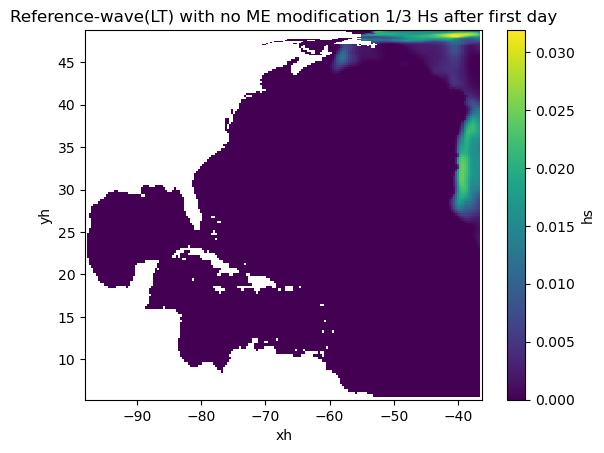

<Figure size 640x480 with 0 Axes>

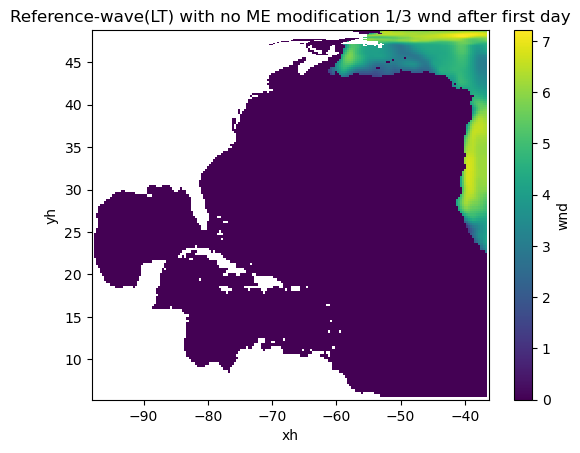

<Figure size 640x480 with 0 Axes>

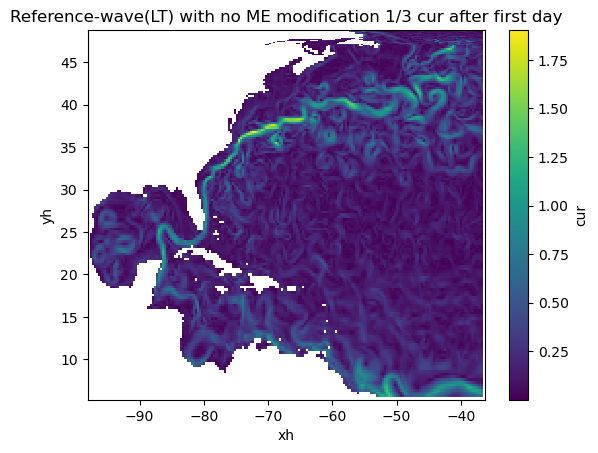

<Figure size 640x480 with 0 Axes>

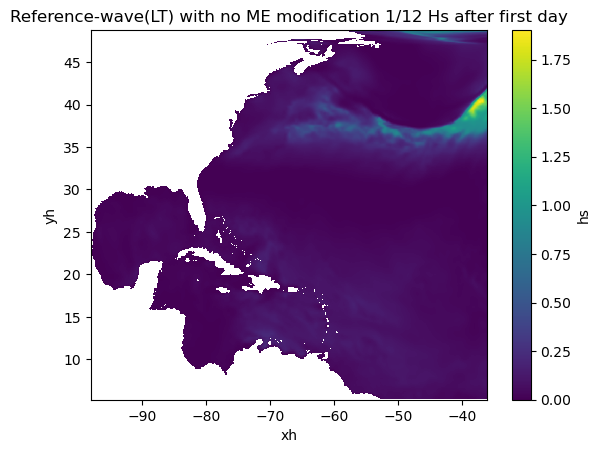

<Figure size 640x480 with 0 Axes>

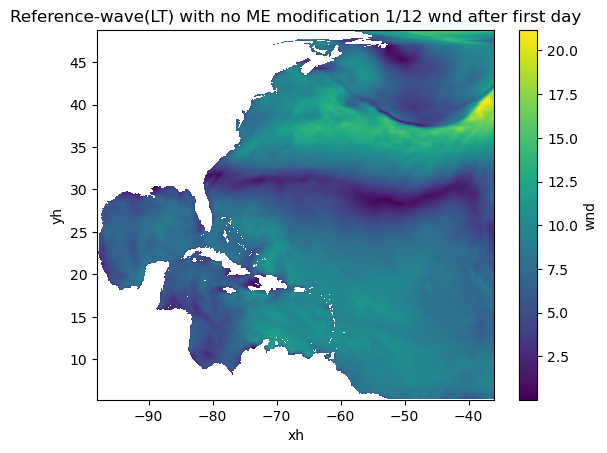

<Figure size 640x480 with 0 Axes>

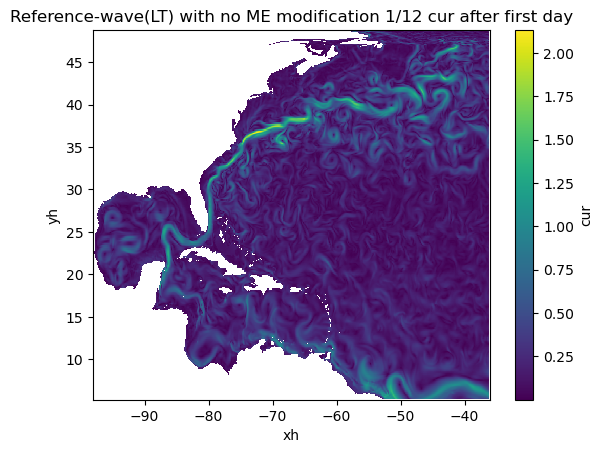

<Figure size 640x480 with 0 Axes>

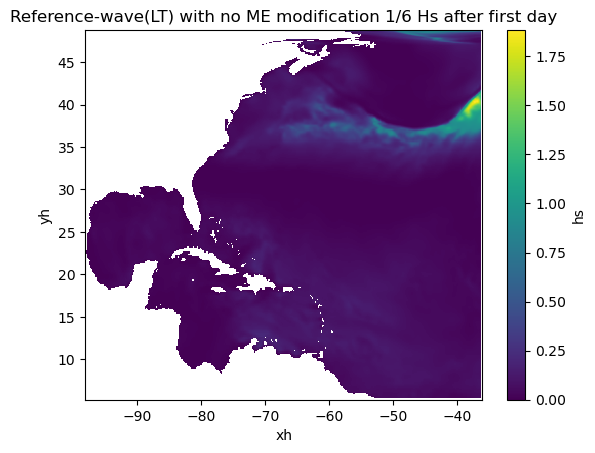

<Figure size 640x480 with 0 Axes>

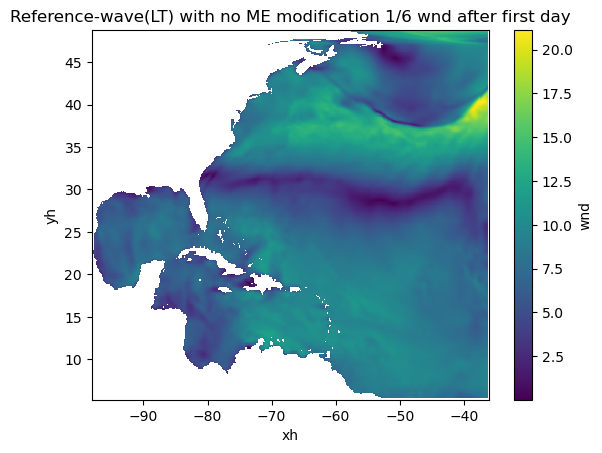

<Figure size 640x480 with 0 Axes>

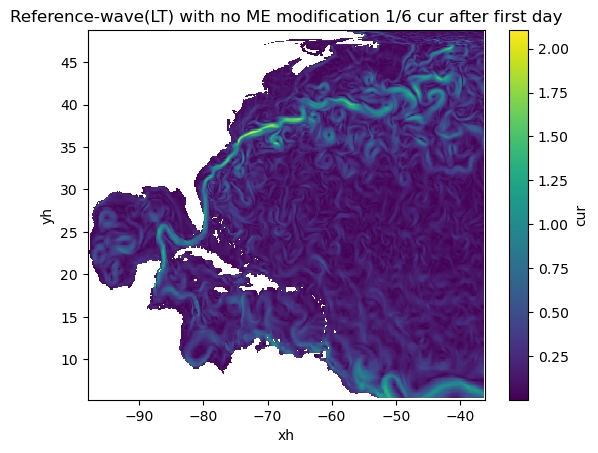

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [16]:
plt.figure()
da_hs_3[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 Hs after first day')
plt.show()
plt.figure()

plt.figure()
da_wnd_3[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 wnd after first day')
plt.show()
plt.figure()

plt.figure()
da_cur_3[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/3 cur after first day')
plt.show()
plt.figure()

plt.figure()
da_hs_12[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 Hs after first day')
plt.show()
plt.figure()

plt.figure()
da_wnd_12[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 wnd after first day')
plt.show()
plt.figure()

plt.figure()
da_cur_12[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/12 cur after first day')
plt.show()
plt.figure()

plt.figure()
da_hs_6[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 Hs after first day')
plt.show()
plt.figure()

plt.figure()
da_wnd_6[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 wnd after first day')
plt.show()
plt.figure()

plt.figure()
da_cur_6[1,:,:].plot()
plt.title('Reference-wave(LT) with no ME modification 1/6 cur after first day')
plt.show()
plt.figure()